In [168]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [169]:
import sys
# modify "customized_path_to_homework", path of folder in drive, where you uploaded your homework
assignment_path = "/content/drive/My Drive/TrafficStopsWebGeneration/"
sys.path.append(assignment_path)

In [170]:
import os, sys
import pandas as pd
import numpy as np
import matplotlib.mlab as mlab
import matplotlib.pyplot as plt
import datetime
import warnings
sys.path.insert(0,'../')
%load_ext autoreload
%autoreload 2

warnings.filterwarnings('ignore')

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [171]:
dt = pd.read_csv('/content/drive/My Drive/TrafficStopsWebGeneration/dataset/Officer_Traffic_Stops.csv')
dt.head(2)

,OBJECTID,Month_of_Stop,Reason_for_Stop,Officer_Race,Officer_Gender,Officer_Years_of_Service,Driver_Race,Driver_Ethnicity,Driver_Gender,Driver_Age,Was_a_Search_Conducted,Result_of_Stop,CMPD_Division,GlobalID
0,1,2020/01,Speeding,White,Male,27,White,Non-Hispanic,Female,38,No,Verbal Warning,University City Division,{00000000-0000-0000-0000-000000000000}
1,2,2021/05,Vehicle Equipment,Hispanic/Latino,Female,3,Black,Non-Hispanic,Male,35,No,Verbal Warning,Providence Division,{00000000-0000-0000-0000-000000000000}


In [172]:
!pip install git+git://github.com/geopandas/geopandas.git
import geopandas as gpd

  Cloning git://github.com/geopandas/geopandas.git to /tmp/pip-req-build-brypgd1k
  Running command git clone -q git://github.com/geopandas/geopandas.git /tmp/pip-req-build-brypgd1k


In [173]:
!pip install python-dateutil
!pip install pysal --quiet
from pysal.explore import esda
from pysal.lib import weights
from libpysal.weights.raster import da2W

In [174]:
policePatrols = gpd.read_file('/content/drive/My Drive/TrafficStopsWebGeneration/dataset/CMPD_Police_Response_Areas.geojson')
policePatrols.tail(2)

,OBJECTID,DIVISION,DNAME,RA,SHAPESTArea,SHAPESTLength,geometry
45,987,28,Airport Division,4,1.367281e+08,72021.770514,"MULTIPOLYGON (((-80.95344 35.23227, -80.95355 ..."
46,988,28,Airport Division,5,5.500272e+07,144482.672086,"MULTIPOLYGON (((-80.94763 35.18205, -80.94749 ..."


In [175]:
divisionBreakdownTemp=dt.groupby(['CMPD_Division','Result_of_Stop', 'Was_a_Search_Conducted'])['OBJECTID'].count()
divisionTotalStops=dt.groupby(['CMPD_Division'])['OBJECTID'].count()
divisionTotalStops.head(50)

CMPD_Division
Central Division             7604
Eastway Division             9823
Freedom Division             9142
Hickory Grove Division       9198
Independence Division       10306
Metro Division              10419
North Division              12314
North Tryon Division         8782
Providence Division         12413
South Division              14240
Steele Creek Division        4481
University City Division    11128
Westover Division            6487
Name: OBJECTID, dtype: int64

In [176]:
!pip install contextily
import contextily as cx

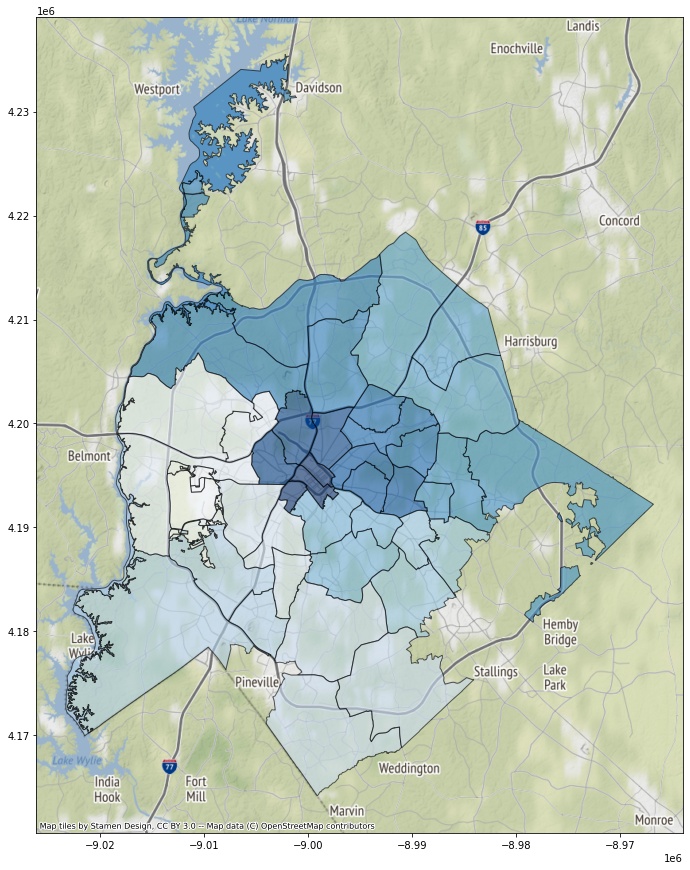

(0.0, 1.0, 0.0, 1.0)

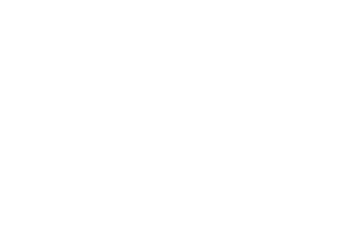

In [177]:
#policePatrols.plot(column="OBJECTID", colormap="coolwarm", figsize=(12.8,9.6))
blockMap = policePatrols.to_crs(epsg=3857)
mapper = blockMap.plot(figsize=(15, 15), alpha=0.6, edgecolor='k', column="DIVISION",colormap="Blues_r")
cx.add_basemap(mapper)
plt.show()
plt.axis('off')

In [178]:
censusBlocks = gpd.read_file('/content/drive/My Drive/TrafficStopsWebGeneration/dataset/Census_Block_Groups.geojson')
censusBlocks.tail(2)

,OBJECTID,STATEFP10,COUNTYFP10,TRACTCE10,BLKGRPCE10,GEOID10,NAMELSAD10,ALAND10,AWATER10,Latitude,Longitude,Population,White,African_American,AmerIn_AlaskaNative,Asian,NatHawaiian_PacIslander,Some_other_race,Two_or_more_races,Hispanic,Housing_Units,Occupied_Housing_Units,Vacant_Housing_Units,Occupancy_Rate,Percent_White,Percent_African_American,Percent_Asian,Percent_Hispanic,Pop_SqMi,SqMi,ShapeSTArea,ShapeSTLength,geometry
553,554,37,119,006007,3,371190060073,Block Group 3,2895452,442994,35.335342,-80.969297,1837,1318,349,1,98,0,25,46,60,718,671,47,0.934540,0.717474,0.189984,0.053348,0.032662,1425.521407,1.288651,3.592554e+07,29452.152742,"POLYGON ((-80.97015 35.34795, -80.97134 35.349..."
554,555,37,119,006407,2,371190064072,Block Group 2,2118223,137,35.445588,-80.853120,1921,1661,116,7,73,0,23,41,106,674,631,43,0.936202,0.864654,0.060385,0.038001,0.055180,2349.268015,0.817701,2.279621e+07,20698.997432,"POLYGON ((-80.86233 35.45086, -80.86240 35.450..."


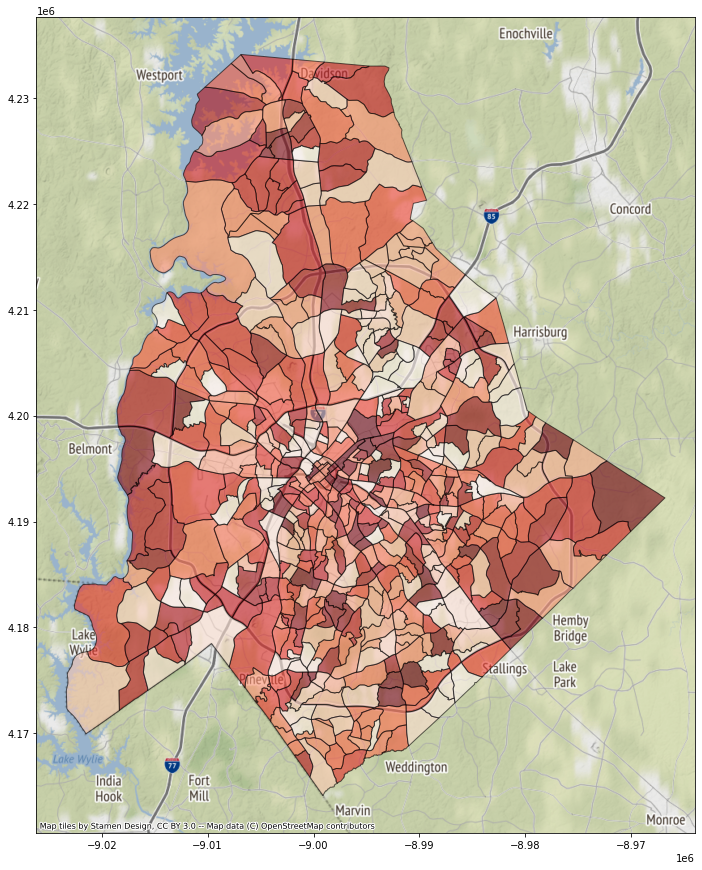

(0.0, 1.0, 0.0, 1.0)

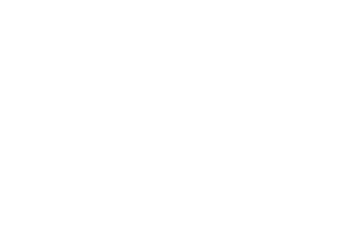

In [179]:
#censusBlocks.plot(column="OBJECTID", colormap="Purples", figsize=(12.8,9.6))
#plt.show()
blockMap = censusBlocks.to_crs(epsg=3857)
mapper = blockMap.plot(figsize=(15, 15), alpha=0.6, edgecolor='k', column="OBJECTID",colormap="Reds_r")
cx.add_basemap(mapper)
plt.show()
plt.axis('off')

In [180]:
joinedBlocks=policePatrols.sjoin(censusBlocks, how="left", op="intersects")
#joinedBlocks=gpd.overlay(policePatrols, censusBlocks, how='intersection')
joinedBlocks.head(5)

,OBJECTID_left,DIVISION,DNAME,RA,SHAPESTArea,SHAPESTLength,geometry,index_right,OBJECTID_right,STATEFP10,COUNTYFP10,TRACTCE10,BLKGRPCE10,GEOID10,NAMELSAD10,ALAND10,AWATER10,Latitude,Longitude,Population,White,African_American,AmerIn_AlaskaNative,Asian,NatHawaiian_PacIslander,Some_other_race,Two_or_more_races,Hispanic,Housing_Units,Occupied_Housing_Units,Vacant_Housing_Units,Occupancy_Rate,Percent_White,Percent_African_American,Percent_Asian,Percent_Hispanic,Pop_SqMi,SqMi,ShapeSTArea,ShapeSTLength
0,942,01,Central Division,1,3.439213e+07,28974.02267,"POLYGON ((-80.83960 35.23706, -80.83969 35.237...",6,7,37,119,002500,2,371190025002,Block Group 2,983821,0,35.218428,-80.825812,665,584,53,3,10,0,4,11,19,367,318,49,0.866485,0.878195,0.079699,0.015038,0.028571,1751.114973,0.379758,1.058705e+07,13404.659665
0,942,01,Central Division,1,3.439213e+07,28974.02267,"POLYGON ((-80.83960 35.23706, -80.83969 35.237...",345,346,37,119,000800,2,371190008002,Block Group 2,363297,0,35.224469,-80.823478,588,29,539,3,2,0,0,15,20,251,212,39,0.844622,0.049320,0.916667,0.003401,0.034014,4193.020200,0.140233,3.909473e+06,8424.957270
0,942,01,Central Division,1,3.439213e+07,28974.02267,"POLYGON ((-80.83960 35.23706, -80.83969 35.237...",33,34,37,119,000600,2,371190006002,Block Group 2,708103,0,35.220541,-80.836291,3260,1235,1874,2,108,0,16,25,181,1279,1119,160,0.874902,0.378834,0.574847,0.033129,0.055521,11927.075378,0.273328,7.619939e+06,17053.741974
0,942,01,Central Division,1,3.439213e+07,28974.02267,"POLYGON ((-80.83960 35.23706, -80.83969 35.237...",142,143,37,119,000600,1,371190006001,Block Group 1,366220,0,35.225913,-80.829977,840,501,274,1,29,1,11,23,31,484,449,35,0.927686,0.596429,0.326190,0.034524,0.036905,5942.208197,0.141362,3.940935e+06,9395.534300
0,942,01,Central Division,1,3.439213e+07,28974.02267,"POLYGON ((-80.83960 35.23706, -80.83969 35.237...",311,312,37,119,000100,4,371190001004,Block Group 4,418131,0,35.227663,-80.838039,82,55,17,0,2,0,3,5,8,85,69,16,0.811765,0.670732,0.207317,0.024390,0.097561,508.058579,0.161399,4.499537e+06,10270.217017


In [181]:
#joinedBlocks.sort_values(by=joinedBlocks.geometry.area, inplace=True, ascending=False)
joinedBlocks['area']=joinedBlocks.geometry.area
joinedBlocks=joinedBlocks.sort_values('area', ascending=False)

joinedBlocks=joinedBlocks.drop_duplicates(subset='GEOID10', keep='first')
joinedBlocks.head(2)

,OBJECTID_left,DIVISION,DNAME,RA,SHAPESTArea,SHAPESTLength,geometry,index_right,OBJECTID_right,STATEFP10,COUNTYFP10,TRACTCE10,BLKGRPCE10,GEOID10,NAMELSAD10,ALAND10,AWATER10,Latitude,Longitude,Population,White,African_American,AmerIn_AlaskaNative,Asian,NatHawaiian_PacIslander,Some_other_race,Two_or_more_races,Hispanic,Housing_Units,Occupied_Housing_Units,Vacant_Housing_Units,Occupancy_Rate,Percent_White,Percent_African_American,Percent_Asian,Percent_Hispanic,Pop_SqMi,SqMi,ShapeSTArea,ShapeSTLength,area
31,973,21,Steele Creek Division,3,1.077709e+09,421621.499051,"POLYGON ((-80.99719 35.17594, -80.99719 35.175...",52,53,37,119,005907,1,371190059071,Block Group 1,3853680,149827,35.165058,-80.984772,2617,1446,612,7,347,4,120,81,333,956,897,59,0.938285,0.552541,0.233856,0.132595,0.127245,1693.449379,1.545367,4.308235e+07,32032.423426,0.009902
31,973,21,Steele Creek Division,3,1.077709e+09,421621.499051,"POLYGON ((-80.99719 35.17594, -80.99719 35.175...",109,110,37,119,005906,4,371190059064,Block Group 4,10057180,68797,35.191443,-80.974321,628,475,93,2,20,0,27,11,56,250,231,19,0.924000,0.756369,0.148089,0.031847,0.089172,160.669086,3.908655,1.089670e+08,57753.692084,0.009902


In [182]:
#joinedBlocks=joinedBlocks.sort_values('Percent_African_American', ascending=False)
table1=(joinedBlocks.groupby(['DNAME'])['African_American'].sum()).to_frame()
table2=(joinedBlocks.groupby(['DNAME'])['White'].sum()).to_frame()
table3=(joinedBlocks.groupby(['DNAME'])['AmerIn_AlaskaNative'].sum()).to_frame()
table4=(joinedBlocks.groupby(['DNAME'])['Asian'].sum()).to_frame()
table5=(joinedBlocks.groupby(['DNAME'])['NatHawaiian_PacIslander'].sum()).to_frame()
table6=(joinedBlocks.groupby(['DNAME'])['Hispanic'].sum()).to_frame()

temp=table1.join(table2, on='DNAME')
temp=temp.join(table3, on='DNAME')
temp=temp.join(table4, on='DNAME')
temp=temp.join(table5, on='DNAME')
temp=temp.join(table6, on='DNAME')


table7=(dt.groupby(['CMPD_Division'])['OBJECTID'].count()).to_frame()
table7=table7.rename(columns={"OBJECTID": "Total_Stops"})
table8=(dt.groupby(['CMPD_Division', 'Result_of_Stop'])['OBJECTID'].count()).to_frame()
table8=table8.rename(columns={"OBJECTID": "Result_of_Stop2"})
table9=(dt.groupby(['CMPD_Division', 'Was_a_Search_Conducted'])['OBJECTID'].count()).to_frame()
table9=table9.rename(columns={"OBJECTID": "Was_a_Search_Conducted2"})

table8=table8.reset_index()
table8=table8.pivot(index='CMPD_Division', columns='Result_of_Stop', values='Result_of_Stop2')
table9=table9.reset_index()
table9=table9.pivot('CMPD_Division', columns='Was_a_Search_Conducted', values='Was_a_Search_Conducted2')

temp2=table7.join(table8, on='CMPD_Division')
temp2=temp2.join(table9, on='CMPD_Division')
temp=temp.reset_index()
temp2=temp2.reset_index()

temp2=temp2.rename(columns={"CMPD_Division": "DNAME"})
temp['DNAME']=temp['DNAME'].astype(object)
temp2['DNAME']=temp2['DNAME'].astype(object)
divisionStats=pd.merge(temp, temp2, on=['DNAME', 'DNAME'], how='left')
divisionStats.head(2)

,DNAME,African_American,White,AmerIn_AlaskaNative,Asian,NatHawaiian_PacIslander,Hispanic,Total_Stops,Arrest,Citation Issued,No Action Taken,Verbal Warning,Written Warning,No,Yes
0,Central Division,1832,4784,16,283,2,254,7604,219,2307,205,4567,306,7172,432
1,Eastway Division,15860,17776,270,2053,68,8701,9823,252,4243,280,4898,150,9443,380


In [183]:
divisionStats['Percent_African_American']=divisionStats['African_American'] / (divisionStats['African_American']+divisionStats['White']+divisionStats['AmerIn_AlaskaNative']+divisionStats['Asian']+divisionStats['NatHawaiian_PacIslander']+divisionStats['Hispanic'])
divisionStats['Percent_White']=divisionStats['White'] / (divisionStats['African_American']+divisionStats['White']+divisionStats['AmerIn_AlaskaNative']+divisionStats['Asian']+divisionStats['NatHawaiian_PacIslander']+divisionStats['Hispanic'])
divisionStats['Percent_Hispanic']=divisionStats['Hispanic'] / (divisionStats['African_American']+divisionStats['White']+divisionStats['AmerIn_AlaskaNative']+divisionStats['Asian']+divisionStats['NatHawaiian_PacIslander']+divisionStats['Hispanic'])
divisionStats['Percent_Asian']=divisionStats['Asian'] / (divisionStats['African_American']+divisionStats['White']+divisionStats['AmerIn_AlaskaNative']+divisionStats['Asian']+divisionStats['NatHawaiian_PacIslander']+divisionStats['Hispanic'])
divisionStats['Percent_AmerIn_AlaskaNative']=divisionStats['AmerIn_AlaskaNative'] / (divisionStats['African_American']+divisionStats['White']+divisionStats['AmerIn_AlaskaNative']+divisionStats['Asian']+divisionStats['NatHawaiian_PacIslander']+divisionStats['Hispanic'])

In [184]:
divisionStats=divisionStats.sort_values('Percent_White', ascending=True)
divisionStats.head(20)

,DNAME,African_American,White,AmerIn_AlaskaNative,Asian,NatHawaiian_PacIslander,Hispanic,Total_Stops,Arrest,Citation Issued,No Action Taken,Verbal Warning,Written Warning,No,Yes,Percent_African_American,Percent_White,Percent_Hispanic,Percent_Asian,Percent_AmerIn_AlaskaNative
5,Metro Division,19166,2999,93,404,10,918,10419,598,2013,441,7133,234,8566,1853,0.812463,0.127130,0.038915,0.017126,0.003942
7,North Tryon Division,16557,6538,200,587,52,8237,8782,391,2110,283,5775,223,7807,975,0.514656,0.203227,0.256038,0.018246,0.006217
2,Freedom Division,21515,12019,280,2925,46,4471,9142,172,5402,134,2513,921,8781,361,0.521500,0.291327,0.108372,0.070899,0.006787
12,Westover Division,13061,8673,135,449,7,3054,6487,200,2235,158,3540,354,6047,440,0.514638,0.341739,0.120336,0.017692,0.005319
1,Eastway Division,15860,17776,270,2053,68,8701,9823,252,4243,280,4898,150,9443,380,0.354588,0.397424,0.194531,0.045900,0.006036
11,University City Division,50686,51538,526,9517,81,13103,11128,245,5649,227,4647,360,10618,510,0.404030,0.410822,0.104447,0.075862,0.004193
10,Steele Creek Division,27008,36528,487,4543,94,19709,4481,108,1772,139,2226,236,4255,226,0.305628,0.413358,0.223031,0.051409,0.005511
3,Hickory Grove Division,30666,35148,619,2375,63,15515,9198,254,2558,249,5909,228,8656,542,0.363402,0.416515,0.183858,0.028144,0.007335
6,North Division,41590,47722,500,2840,62,9011,12314,371,4075,341,7175,352,11582,732,0.408847,0.469128,0.088582,0.027918,0.004915
4,Independence Division,15414,24968,262,1941,48,7841,10306,130,4023,159,5736,258,10064,242,0.305385,0.494671,0.155347,0.038455,0.005191


In [185]:
patrolStats=pd.merge(policePatrols, divisionStats, on=['DNAME', 'DNAME'], how='left')
x=patrolStats['Total_Stops'].sum()
print(x)

408120.0


In [186]:
patrolStats['Percent_Searched']=(patrolStats['Yes']/(patrolStats['Yes']+patrolStats['No']))
patrolStats['Percent_Arrested']=(patrolStats['Arrest']/(patrolStats['Arrest']+patrolStats['Citation Issued'] + patrolStats['No Action Taken'] + patrolStats['Verbal Warning'] + patrolStats['Written Warning']))
patrolStats['Percent_Fined']=(patrolStats['Citation Issued']/(patrolStats['Arrest']+patrolStats['Citation Issued'] + patrolStats['No Action Taken'] + patrolStats['Verbal Warning'] + patrolStats['Written Warning']))
patrolStats['Percent_Slap_on_Wrist']=((patrolStats['No Action Taken'] + patrolStats['Verbal Warning'] + patrolStats['Written Warning'])/(patrolStats['Arrest']+patrolStats['Citation Issued'] + patrolStats['No Action Taken'] + patrolStats['Verbal Warning'] + patrolStats['Written Warning']))
patrolStats['Percent_Stopped']=(patrolStats['Total_Stops']/(x))
patrolStats=patrolStats.sort_values('Percent_Searched', ascending=False)
patrolStats.head(50)

,OBJECTID,DIVISION,DNAME,RA,SHAPESTArea,SHAPESTLength,geometry,African_American,White,AmerIn_AlaskaNative,Asian,NatHawaiian_PacIslander,Hispanic,Total_Stops,Arrest,Citation Issued,No Action Taken,Verbal Warning,Written Warning,No,Yes,Percent_African_American,Percent_White,Percent_Hispanic,Percent_Asian,Percent_AmerIn_AlaskaNative,Percent_Searched,Percent_Arrested,Percent_Fined,Percent_Slap_on_Wrist,Percent_Stopped
3,945,02,Metro Division,1,1.157784e+08,49361.826309,"POLYGON ((-80.80890 35.27655, -80.80886 35.276...",19166.0,2999.0,93.0,404.0,10.0,918.0,10419.0,598.0,2013.0,441.0,7133.0,234.0,8566.0,1853.0,0.812463,0.127130,0.038915,0.017126,0.003942,0.177848,0.057395,0.193205,0.749400,0.025529
4,946,02,Metro Division,2,1.417219e+08,56054.667851,"POLYGON ((-80.85844 35.28798, -80.85881 35.288...",19166.0,2999.0,93.0,404.0,10.0,918.0,10419.0,598.0,2013.0,441.0,7133.0,234.0,8566.0,1853.0,0.812463,0.127130,0.038915,0.017126,0.003942,0.177848,0.057395,0.193205,0.749400,0.025529
5,947,02,Metro Division,3,1.066216e+08,44685.283372,"POLYGON ((-80.86864 35.24731, -80.86879 35.247...",19166.0,2999.0,93.0,404.0,10.0,918.0,10419.0,598.0,2013.0,441.0,7133.0,234.0,8566.0,1853.0,0.812463,0.127130,0.038915,0.017126,0.003942,0.177848,0.057395,0.193205,0.749400,0.025529
9,951,07,North Tryon Division,1,1.126049e+08,49970.580864,"POLYGON ((-80.73632 35.26514, -80.73635 35.265...",16557.0,6538.0,200.0,587.0,52.0,8237.0,8782.0,391.0,2110.0,283.0,5775.0,223.0,7807.0,975.0,0.514656,0.203227,0.256038,0.018246,0.006217,0.111023,0.044523,0.240264,0.715213,0.021518
10,952,07,North Tryon Division,2,1.324678e+08,81768.359851,"POLYGON ((-80.76239 35.28336, -80.76259 35.283...",16557.0,6538.0,200.0,587.0,52.0,8237.0,8782.0,391.0,2110.0,283.0,5775.0,223.0,7807.0,975.0,0.514656,0.203227,0.256038,0.018246,0.006217,0.111023,0.044523,0.240264,0.715213,0.021518
11,953,07,North Tryon Division,3,1.136981e+08,46309.815960,"POLYGON ((-80.77635 35.28586, -80.77635 35.285...",16557.0,6538.0,200.0,587.0,52.0,8237.0,8782.0,391.0,2110.0,283.0,5775.0,223.0,7807.0,975.0,0.514656,0.203227,0.256038,0.018246,0.006217,0.111023,0.044523,0.240264,0.715213,0.021518
38,980,26,Westover Division,3,1.100783e+08,52941.403543,"POLYGON ((-80.86231 35.17252, -80.86244 35.172...",13061.0,8673.0,135.0,449.0,7.0,3054.0,6487.0,200.0,2235.0,158.0,3540.0,354.0,6047.0,440.0,0.514638,0.341739,0.120336,0.017692,0.005319,0.067828,0.030831,0.344535,0.624634,0.015895
37,979,26,Westover Division,2,1.438478e+08,65364.048460,"POLYGON ((-80.87173 35.21102, -80.87198 35.211...",13061.0,8673.0,135.0,449.0,7.0,3054.0,6487.0,200.0,2235.0,158.0,3540.0,354.0,6047.0,440.0,0.514638,0.341739,0.120336,0.017692,0.005319,0.067828,0.030831,0.344535,0.624634,0.015895
36,978,26,Westover Division,1,2.119943e+08,71875.998278,"POLYGON ((-80.91390 35.22529, -80.91407 35.225...",13061.0,8673.0,135.0,449.0,7.0,3054.0,6487.0,200.0,2235.0,158.0,3540.0,354.0,6047.0,440.0,0.514638,0.341739,0.120336,0.017692,0.005319,0.067828,0.030831,0.344535,0.624634,0.015895
13,955,11,North Division,2,5.743533e+08,214686.981514,"POLYGON ((-80.94045 35.34940, -80.94042 35.349...",41590.0,47722.0,500.0,2840.0,62.0,9011.0,12314.0,371.0,4075.0,341.0,7175.0,352.0,11582.0,732.0,0.408847,0.469128,0.088582,0.027918,0.004915,0.059445,0.030128,0.330924,0.638948,0.030172


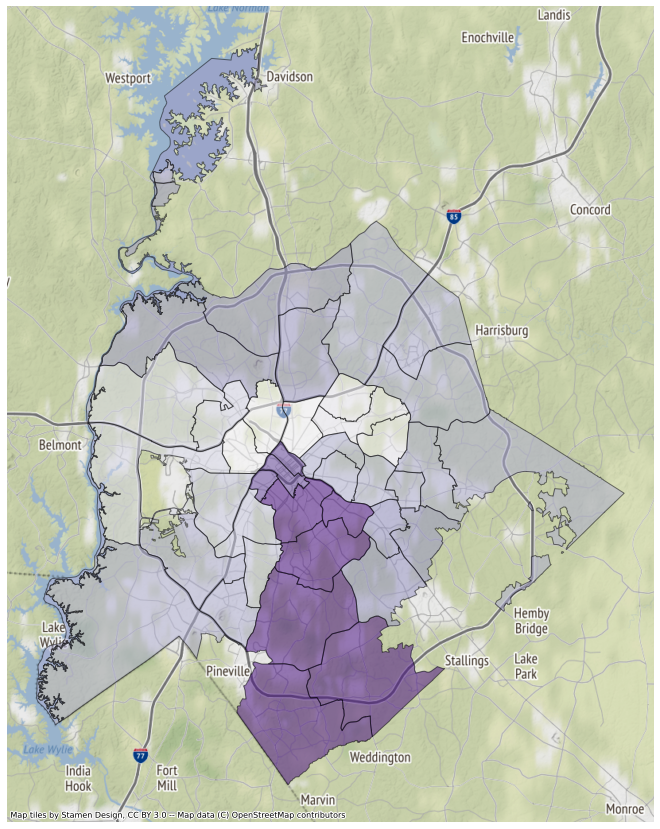

In [187]:
blockMap = patrolStats.to_crs(epsg=3857)
mapper = blockMap.plot(figsize=(15, 15), alpha=0.5, edgecolor='k', column="Percent_White",colormap="Purples")
cx.add_basemap(mapper)
plt.axis('off')
plt.savefig('/content/drive/My Drive/TrafficStopsWebGeneration/HTML/images/percent_map_white.png', bbox_inches='tight')

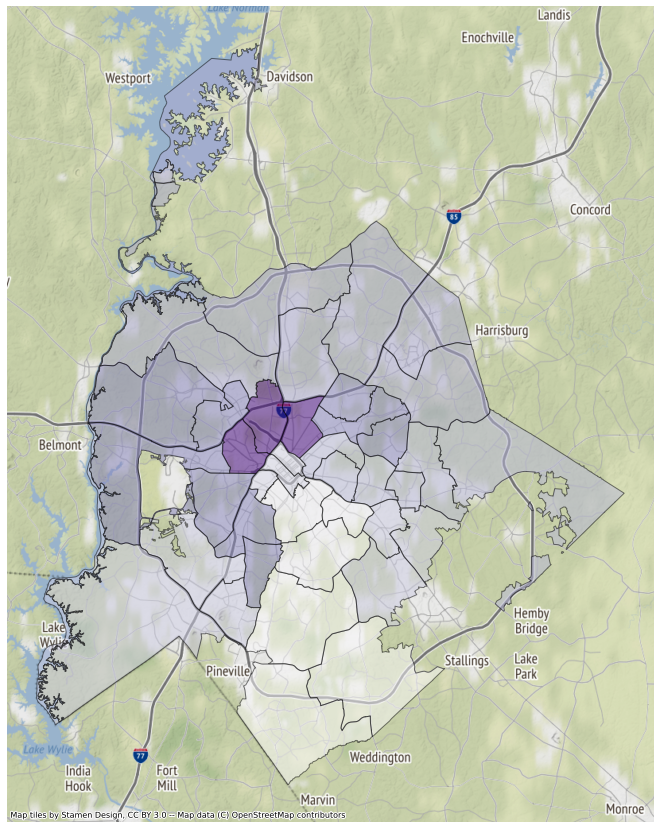

In [188]:
blockMap = patrolStats.to_crs(epsg=3857)
mapper = blockMap.plot(figsize=(15, 15), alpha=0.5, edgecolor='k', column="Percent_African_American",colormap="Purples")
cx.add_basemap(mapper)
plt.axis('off')
plt.savefig('/content/drive/My Drive/TrafficStopsWebGeneration/HTML/images/percent_map_black.png', bbox_inches='tight')

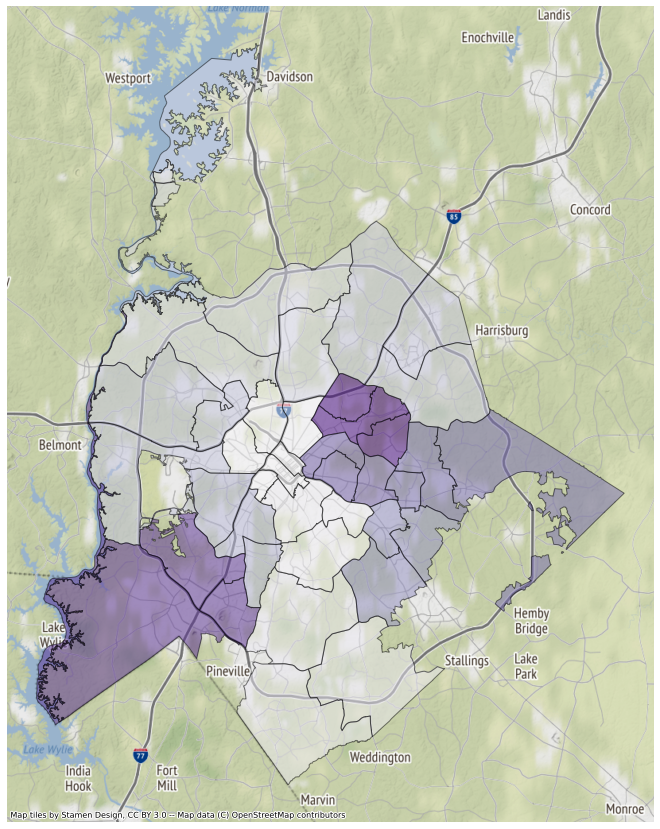

In [189]:
blockMap = patrolStats.to_crs(epsg=3857)
mapper = blockMap.plot(figsize=(15, 15), alpha=0.5, edgecolor='k', column="Percent_Hispanic",colormap="Purples")
cx.add_basemap(mapper)
plt.axis('off')
plt.savefig('/content/drive/My Drive/TrafficStopsWebGeneration/HTML/images/percent_map_hispanic.png', bbox_inches='tight')

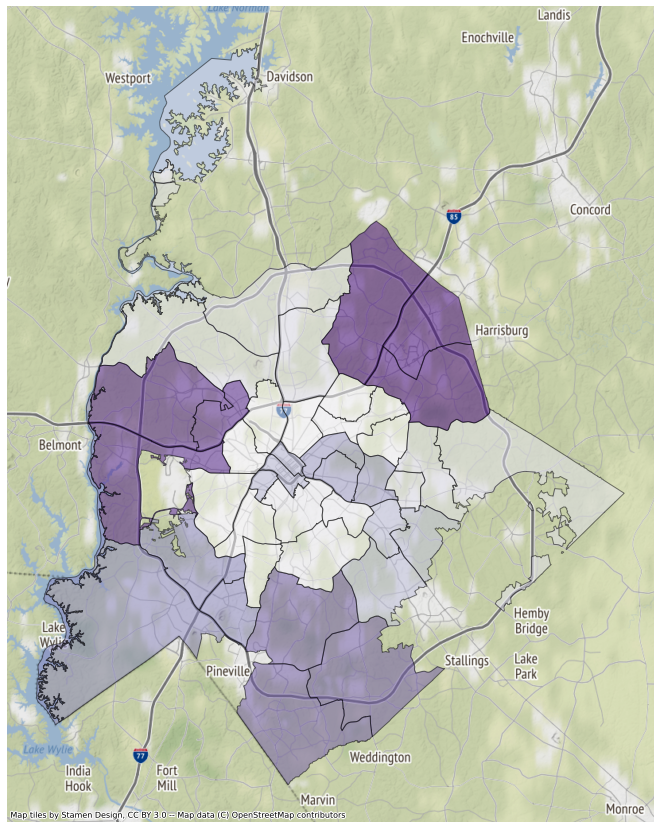

In [190]:
blockMap = patrolStats.to_crs(epsg=3857)
mapper = blockMap.plot(figsize=(15, 15), alpha=0.5, edgecolor='k', column="Percent_Asian",colormap="Purples")
cx.add_basemap(mapper)
plt.axis('off')
plt.savefig('/content/drive/My Drive/TrafficStopsWebGeneration/HTML/images/percent_map_asian.png', bbox_inches='tight')

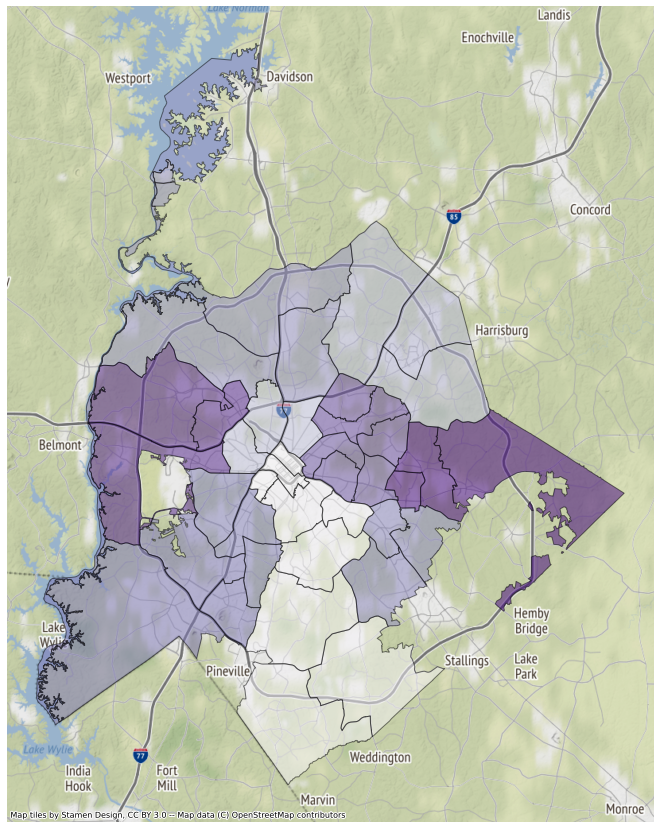

In [191]:
blockMap = patrolStats.to_crs(epsg=3857)
mapper = blockMap.plot(figsize=(15, 15), alpha=0.5, edgecolor='k', column="Percent_AmerIn_AlaskaNative",colormap="Purples")
cx.add_basemap(mapper)
plt.axis('off')
plt.savefig('/content/drive/My Drive/TrafficStopsWebGeneration/HTML/images/percent_map_native_american.png', bbox_inches='tight')

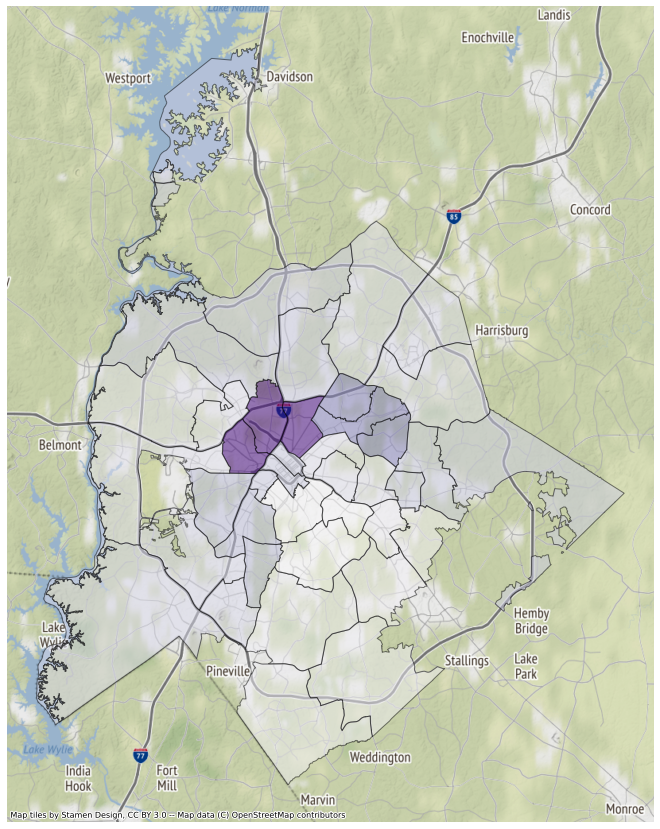

In [192]:
blockMap = patrolStats.to_crs(epsg=3857)
mapper = blockMap.plot(figsize=(15, 15), alpha=0.5, edgecolor='k', column="Percent_Searched",colormap="Purples")
cx.add_basemap(mapper)
plt.axis('off')
plt.savefig('/content/drive/My Drive/TrafficStopsWebGeneration/HTML/images/percent_map_searched.png', bbox_inches='tight')

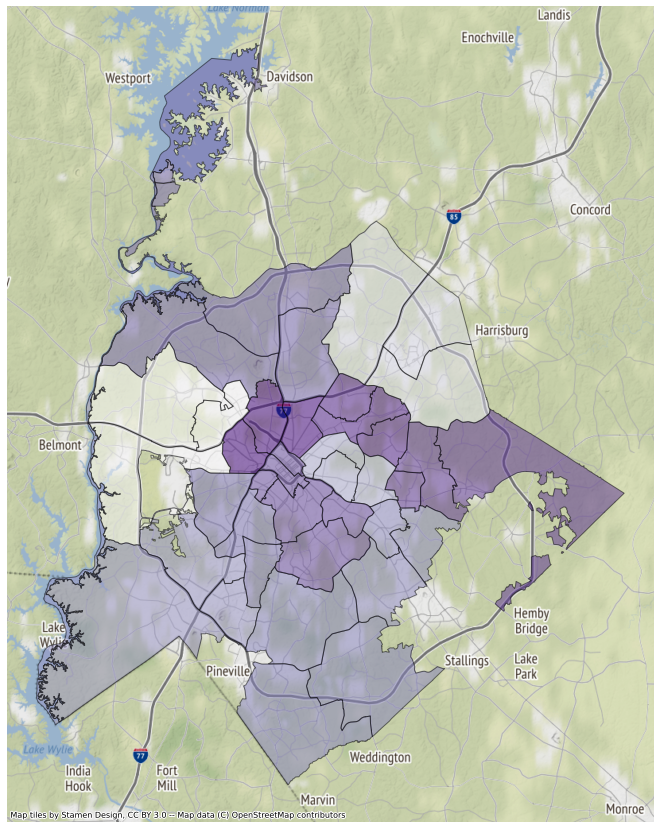

In [193]:
blockMap = patrolStats.to_crs(epsg=3857)
mapper = blockMap.plot(figsize=(15, 15), alpha=0.5, edgecolor='k', column="Percent_Slap_on_Wrist",colormap="Purples")
cx.add_basemap(mapper)
plt.axis('off')
plt.savefig('/content/drive/My Drive/TrafficStopsWebGeneration/HTML/images/percent_map_slap.png', bbox_inches='tight')

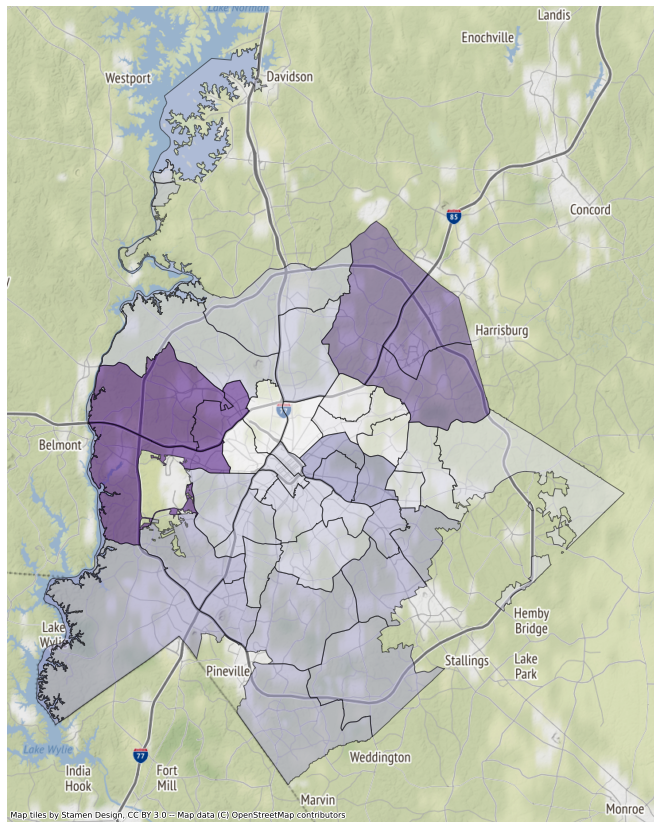

In [194]:
blockMap = patrolStats.to_crs(epsg=3857)
mapper = blockMap.plot(figsize=(15, 15), alpha=0.5, edgecolor='k', column="Percent_Fined",colormap="Purples")
cx.add_basemap(mapper)
plt.axis('off')
plt.savefig('/content/drive/My Drive/TrafficStopsWebGeneration/HTML/images/percent_map_fined.png', bbox_inches='tight')

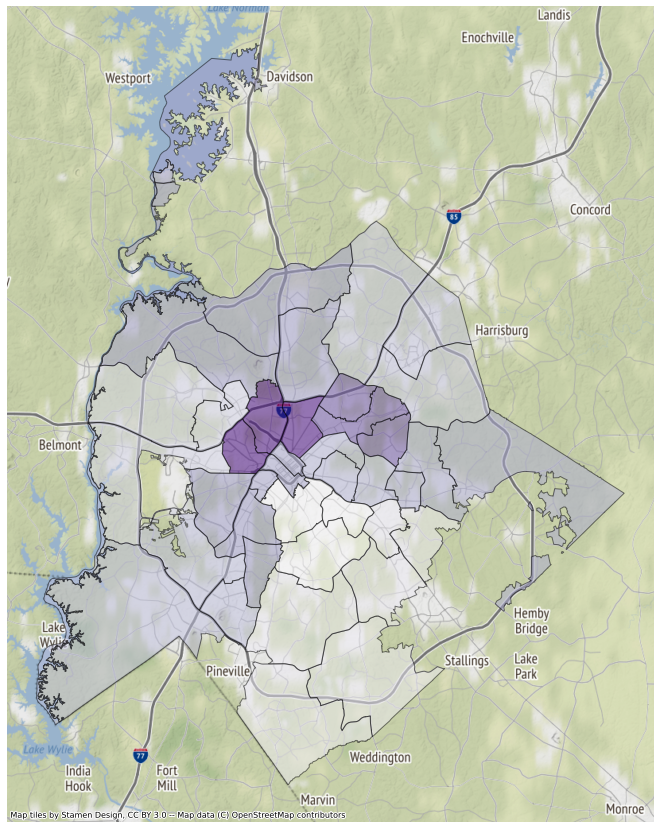

In [195]:
blockMap = patrolStats.to_crs(epsg=3857)
mapper = blockMap.plot(figsize=(15, 15), alpha=0.5, edgecolor='k', column="Percent_Arrested",colormap="Purples")
cx.add_basemap(mapper)
plt.axis('off')
plt.savefig('/content/drive/My Drive/TrafficStopsWebGeneration/HTML/images/percent_map_arrested.png', bbox_inches='tight')

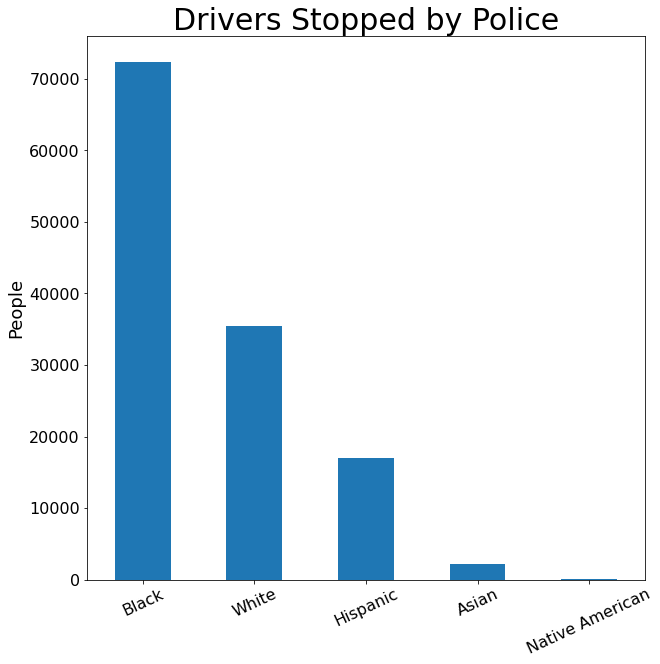

In [196]:
totalStopsRace = dt
totalStopsRace['Driver_Race']= np.where(((totalStopsRace['Driver_Ethnicity']=='Hispanic')),'Hispanic',totalStopsRace['Driver_Race'])
totalStopsRace=totalStopsRace[totalStopsRace['Driver_Race'] != 'Other/Unknown']
result=totalStopsRace.groupby(['Driver_Race'])['OBJECTID'].count()
result=result.sort_values(ascending=False)
result.plot.bar(figsize=(10, 10), ylabel="", xlabel="", fontsize=16)
plt.xticks(rotation=25)
plt.plot()
plt.xlabel('', fontsize=18)
plt.ylabel('People', fontsize=18)
plt.title('Drivers Stopped by Police', fontsize=30)
plt.savefig('/content/drive/My Drive/TrafficStopsWebGeneration/HTML/images/drivers_stopped.png')

In [197]:
print(result)

Driver_Race
Black              72361
White              35446
Hispanic           17028
Asian               2211
Native American       77
Name: OBJECTID, dtype: int64


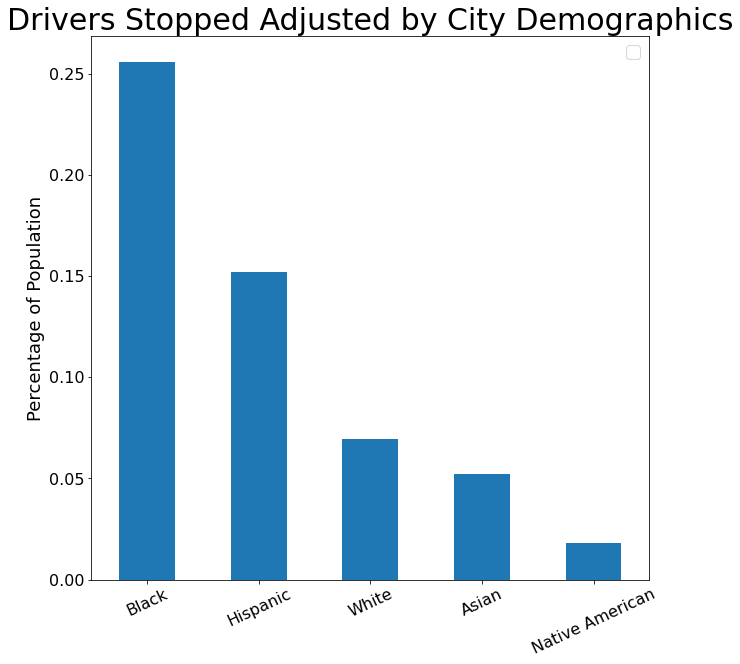

In [198]:
tempCensus=censusBlocks.groupby('STATEFP10', as_index=False).sum()
region=result
percentRace= pd.DataFrame()
percentRace['White']=region['White']/tempCensus['White']
percentRace['Black']=region['Black']/tempCensus['African_American']
percentRace['Native American']=region['Native American']/tempCensus['AmerIn_AlaskaNative']
percentRace['Asian']=region['Asian']/tempCensus['Asian']
percentRace['Hispanic']=region['Hispanic']/tempCensus['Hispanic']

percentRace=percentRace.transpose()
percentRace=percentRace.sort_values(by=0, ascending=False)
percentRace=percentRace.rename(columns={0: "Percent"})

percentRace.plot.bar(figsize=(10, 10), ylabel="", xlabel="", fontsize=16)
plt.xticks(rotation=25)
plt.plot()
plt.legend('')
plt.xlabel('', fontsize=18)
plt.ylabel('Percentage of Population', fontsize=18)
plt.title('Drivers Stopped Adjusted by City Demographics', fontsize=30)
plt.savefig('/content/drive/My Drive/TrafficStopsWebGeneration/HTML/images/drivers_stopped_adjusted.png')

In [199]:
narrow=totalStopsRace
narrow['Slap_on_Wrist']= np.where(((totalStopsRace['Result_of_Stop']=='Verbal Warning') | (totalStopsRace['Result_of_Stop']=='No Action Taken') | (totalStopsRace['Result_of_Stop']== 'Written Warning')),1,0)
narrow['Fined']= np.where(((totalStopsRace['Result_of_Stop']=='Citation Issued')),1,0)
narrow['Arrested']= np.where(((totalStopsRace['Result_of_Stop']=='Arrest')),1,0)

result=narrow.groupby(['Driver_Race'])['Slap_on_Wrist', 'Arrested', 'Fined'].sum()
#result=result.sort_values(ascending=False)
#result.plot.bar(figsize=(10, 10), ylabel="", xlabel="", fontsize=16)

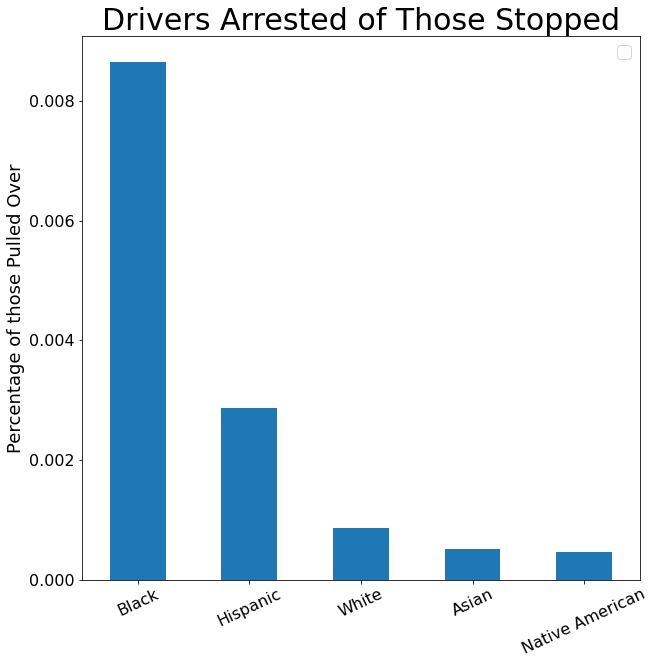

In [200]:
region=result
region=region.drop(columns='Slap_on_Wrist')
#region=region.drop(columns='Arrested')
region=region.drop(columns='Fined')
region=region.transpose()
percentRace= pd.DataFrame()
percentRace['White']=float(region['White'])/tempCensus['White']
percentRace['Black']=float(region['Black'])/tempCensus['African_American']
percentRace['Native American']=float(region['Native American'])/tempCensus['AmerIn_AlaskaNative']
percentRace['Asian']=float(region['Asian'])/tempCensus['Asian']
percentRace['Hispanic']=float(region['Hispanic'])/tempCensus['Hispanic']

percentRace=percentRace.transpose()
percentRace=percentRace.sort_values(by=0, ascending=False)
percentRace=percentRace.rename(columns={0: "Percent"})
percentRace.plot.bar(figsize=(10, 10), ylabel="", xlabel="", fontsize=16)
plt.xticks(rotation=25)
plt.plot()
plt.legend('')
plt.xlabel('', fontsize=18)
plt.ylabel('Percentage of those Pulled Over', fontsize=18)
plt.title('Drivers Arrested of Those Stopped', fontsize=30)
plt.savefig('/content/drive/My Drive/TrafficStopsWebGeneration/HTML/images/drivers_arrested_adjusted.png')

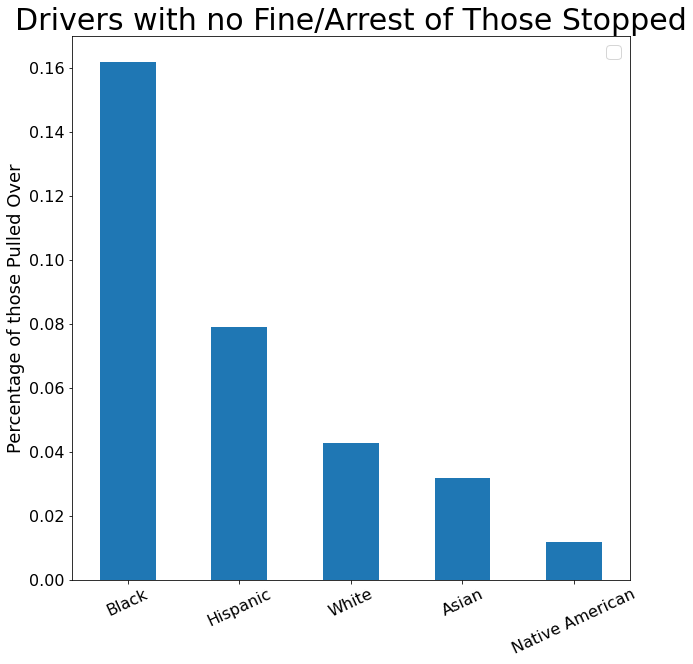

In [201]:
region=result
#region=region.drop(columns='Slap_on_Wrist')
region=region.drop(columns='Arrested')
region=region.drop(columns='Fined')
region=region.transpose()
percentRace= pd.DataFrame()
percentRace['White']=float(region['White'])/tempCensus['White']
percentRace['Black']=float(region['Black'])/tempCensus['African_American']
percentRace['Native American']=float(region['Native American'])/tempCensus['AmerIn_AlaskaNative']
percentRace['Asian']=float(region['Asian'])/tempCensus['Asian']
percentRace['Hispanic']=float(region['Hispanic'])/tempCensus['Hispanic']

percentRace=percentRace.transpose()
percentRace=percentRace.sort_values(by=0, ascending=False)
percentRace=percentRace.rename(columns={0: "Percent"})
percentRace.plot.bar(figsize=(10, 10), ylabel="", xlabel="", fontsize=16)
plt.xticks(rotation=25)
plt.plot()
plt.legend('')
plt.xlabel('', fontsize=18)
plt.ylabel('Percentage of those Pulled Over', fontsize=18)
plt.title('Drivers with no Fine/Arrest of Those Stopped', fontsize=30)
plt.savefig('/content/drive/My Drive/TrafficStopsWebGeneration/HTML/images/drivers_slap_adjusted.png')

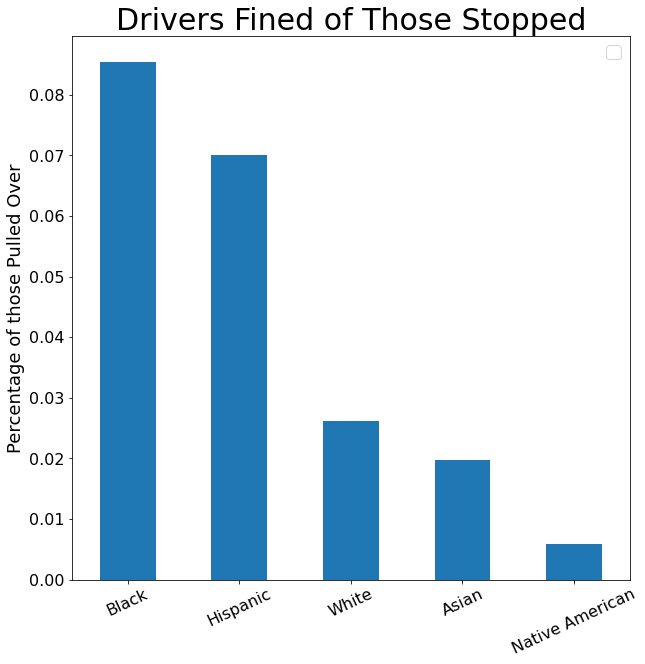

In [202]:
region=result
region=region.drop(columns='Slap_on_Wrist')
region=region.drop(columns='Arrested')
#region=region.drop(columns='Fined')
region=region.transpose()
percentRace= pd.DataFrame()
percentRace['White']=float(region['White'])/tempCensus['White']
percentRace['Black']=float(region['Black'])/tempCensus['African_American']
percentRace['Native American']=float(region['Native American'])/tempCensus['AmerIn_AlaskaNative']
percentRace['Asian']=float(region['Asian'])/tempCensus['Asian']
percentRace['Hispanic']=float(region['Hispanic'])/tempCensus['Hispanic']

percentRace=percentRace.transpose()
percentRace=percentRace.sort_values(by=0, ascending=False)
percentRace=percentRace.rename(columns={0: "Percent"})
percentRace.plot.bar(figsize=(10, 10), ylabel="", xlabel="", fontsize=16)
plt.xticks(rotation=25)
plt.plot()
plt.legend('')
plt.xlabel('', fontsize=18)
plt.ylabel('Percentage of those Pulled Over', fontsize=18)
plt.title('Drivers Fined of Those Stopped', fontsize=30)
plt.savefig('/content/drive/My Drive/TrafficStopsWebGeneration/HTML/images/drivers_fined_adjusted.png')

In [203]:
#joinedBlocks=joinedBlocks.sort_values('Percent_African_American', ascending=False)
dtr=totalStopsRace

#dtr=dtr[dtr['Reason_for_Stop']=='Other                    ']
dtr=dtr[dtr['Driver_Race']!='White']

table1=(joinedBlocks.groupby(['DNAME'])['African_American'].sum()).to_frame()
table2=(joinedBlocks.groupby(['DNAME'])['White'].sum()).to_frame()
table3=(joinedBlocks.groupby(['DNAME'])['AmerIn_AlaskaNative'].sum()).to_frame()
table4=(joinedBlocks.groupby(['DNAME'])['Asian'].sum()).to_frame()
table5=(joinedBlocks.groupby(['DNAME'])['NatHawaiian_PacIslander'].sum()).to_frame()
table6=(joinedBlocks.groupby(['DNAME'])['Hispanic'].sum()).to_frame()

temp=table1.join(table2, on='DNAME')
temp=temp.join(table3, on='DNAME')
temp=temp.join(table4, on='DNAME')
temp=temp.join(table5, on='DNAME')
temp=temp.join(table6, on='DNAME')


table7=(dtr.groupby(['CMPD_Division'])['OBJECTID'].count()).to_frame()
table7=table7.rename(columns={"OBJECTID": "Total_Stops"})
table8=(dtr.groupby(['CMPD_Division', 'Result_of_Stop'])['OBJECTID'].count()).to_frame()
table8=table8.rename(columns={"OBJECTID": "Result_of_Stop2"})
table9=(dtr.groupby(['CMPD_Division', 'Was_a_Search_Conducted'])['OBJECTID'].count()).to_frame()
table9=table9.rename(columns={"OBJECTID": "Was_a_Search_Conducted2"})

table8=table8.reset_index()
table8=table8.pivot(index='CMPD_Division', columns='Result_of_Stop', values='Result_of_Stop2')
table9=table9.reset_index()
table9=table9.pivot('CMPD_Division', columns='Was_a_Search_Conducted', values='Was_a_Search_Conducted2')

temp2=table7.join(table8, on='CMPD_Division')
temp2=temp2.join(table9, on='CMPD_Division')
temp=temp.reset_index()
temp2=temp2.reset_index()

temp2=temp2.rename(columns={"CMPD_Division": "DNAME"})
temp['DNAME']=temp['DNAME'].astype(object)
temp2['DNAME']=temp2['DNAME'].astype(object)
divisionStats=pd.merge(temp, temp2, on=['DNAME', 'DNAME'], how='left')


divisionStats['Percent_Searched']=(divisionStats['Yes']/(divisionStats['Yes']+divisionStats['No']))
divisionStats['Percent_Arrested']=(divisionStats['Arrest']/(divisionStats['Arrest']+divisionStats['Citation Issued'] + divisionStats['No Action Taken'] + divisionStats['Verbal Warning'] + divisionStats['Written Warning']))
divisionStats['Percent_Fined']=(divisionStats['Citation Issued']/(divisionStats['Arrest']+divisionStats['Citation Issued'] + divisionStats['No Action Taken'] + divisionStats['Verbal Warning'] + divisionStats['Written Warning']))
divisionStats['Percent_Slap_on_Wrist']=((divisionStats['No Action Taken'] + divisionStats['Verbal Warning'] + divisionStats['Written Warning'])/(divisionStats['Arrest']+divisionStats['Citation Issued'] + divisionStats['No Action Taken'] + divisionStats['Verbal Warning'] + divisionStats['Written Warning']))

tempGPD=pd.merge(policePatrols, divisionStats, on=['DNAME', 'DNAME'], how='left')
dtr.head(5)

,OBJECTID,Month_of_Stop,Reason_for_Stop,Officer_Race,Officer_Gender,Officer_Years_of_Service,Driver_Race,Driver_Ethnicity,Driver_Gender,Driver_Age,Was_a_Search_Conducted,Result_of_Stop,CMPD_Division,GlobalID,Slap_on_Wrist,Fined,Arrested
1,2,2021/05,Vehicle Equipment,Hispanic/Latino,Female,3,Black,Non-Hispanic,Male,35,No,Verbal Warning,Providence Division,{00000000-0000-0000-0000-000000000000},1,0,0
2,3,2020/01,Vehicle Equipment,White,Female,4,Black,Non-Hispanic,Male,33,No,Verbal Warning,University City Division,{00000000-0000-0000-0000-000000000000},1,0,0
3,4,2020/01,Speeding,White,Male,25,Black,Non-Hispanic,Male,36,No,Citation Issued,Steele Creek Division,{00000000-0000-0000-0000-000000000000},0,1,0
4,5,2020/01,Vehicle Regulatory,Hispanic/Latino,Male,3,Hispanic,Hispanic,Male,30,No,Verbal Warning,Eastway Division,{00000000-0000-0000-0000-000000000000},1,0,0
5,6,2020/01,Vehicle Regulatory,White,Male,5,Hispanic,Hispanic,Male,43,No,Citation Issued,NaN,{00000000-0000-0000-0000-000000000000},0,1,0


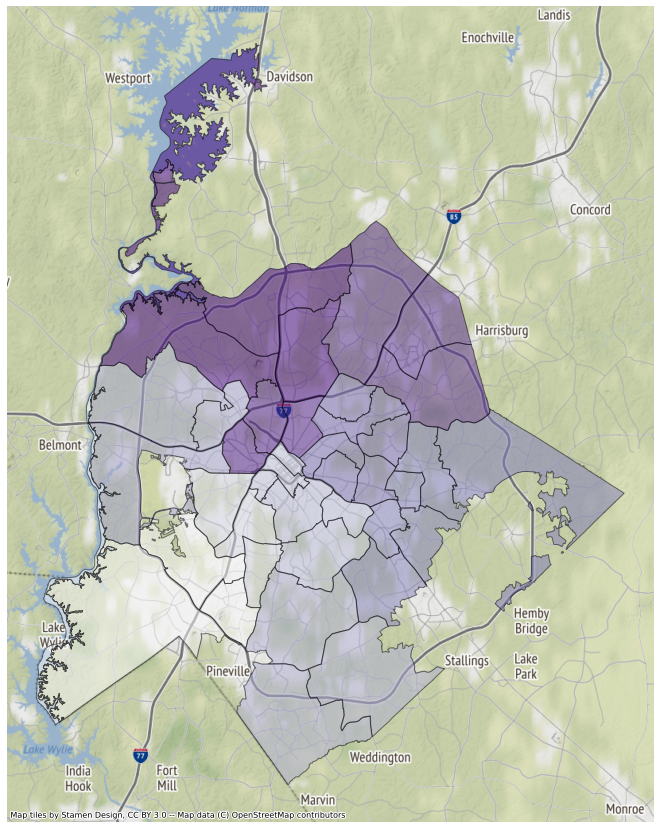

In [204]:
blockMap = tempGPD.to_crs(epsg=3857)
mapper = blockMap.plot(figsize=(15, 15), alpha=0.5, edgecolor='k', column="Total_Stops",colormap="Purples")
cx.add_basemap(mapper)
plt.axis('off')
plt.savefig('/content/drive/My Drive/TrafficStopsWebGeneration/HTML/images/map_total_stops.png', bbox_inches='tight')

In [205]:
wra=dt.groupby(['Reason_for_Stop'])['OBJECTID'].count()
wra.head(50)

Reason_for_Stop
CheckPoint                      71
Driving While Impaired         188
Investigation                 2892
Other                         2633
Safe Movement                 8385
SeatBelt                       780
Speeding                     47189
Stop Light/Sign              11926
Vehicle Equipment            14451
Vehicle Regulatory           41557
Name: OBJECTID, dtype: int64

In [206]:
totalStopsMonthly=totalStopsRace.groupby(['Month_of_Stop', 'Driver_Race'])['OBJECTID'].count()
print(tempCensus['White'])
totalStopsMonthly=totalStopsMonthly.reset_index()
totalStopsMonthly['OBJECTID']=np.where(totalStopsMonthly['Driver_Race']=='White', (totalStopsMonthly['OBJECTID'] / tempCensus['White'].iloc[0])*100, totalStopsMonthly['OBJECTID'])
totalStopsMonthly['OBJECTID']=np.where(totalStopsMonthly['Driver_Race']=='Native American', (totalStopsMonthly['OBJECTID'] / tempCensus['AmerIn_AlaskaNative'].iloc[0])*100, totalStopsMonthly['OBJECTID'])
totalStopsMonthly['OBJECTID']=np.where(totalStopsMonthly['Driver_Race']=='Hispanic', (totalStopsMonthly['OBJECTID'] / tempCensus['Hispanic'].iloc[0])*100, totalStopsMonthly['OBJECTID'])
totalStopsMonthly['OBJECTID']=np.where(totalStopsMonthly['Driver_Race']=='Black', (totalStopsMonthly['OBJECTID'] / tempCensus['African_American'].iloc[0])*100, totalStopsMonthly['OBJECTID'])
totalStopsMonthly['OBJECTID']=np.where(totalStopsMonthly['Driver_Race']=='Asian', (totalStopsMonthly['OBJECTID'] / tempCensus['Asian'].iloc[0])*100, totalStopsMonthly['OBJECTID'])
print(totalStopsMonthly)
totalStopsMonthly=totalStopsMonthly.pivot(index='Month_of_Stop', columns='Driver_Race', values='OBJECTID')
totalStopsMonthly=totalStopsMonthly.div(totalStopsMonthly.sum(axis=1), axis=0);

0    508946
Name: White, dtype: int64
    Month_of_Stop      Driver_Race  OBJECTID
0         2020/01            Asian  0.363619
1         2020/01            Black  2.024017
2         2020/01         Hispanic  1.027299
3         2020/01  Native American  0.187749
4         2020/01            White  0.510074
..            ...              ...       ...
106       2021/11            Asian  0.110975
107       2021/11            Black  0.471705
108       2021/11         Hispanic  0.307297
109       2021/11  Native American  0.023469
110       2021/11            White  0.125161

[111 rows x 3 columns]


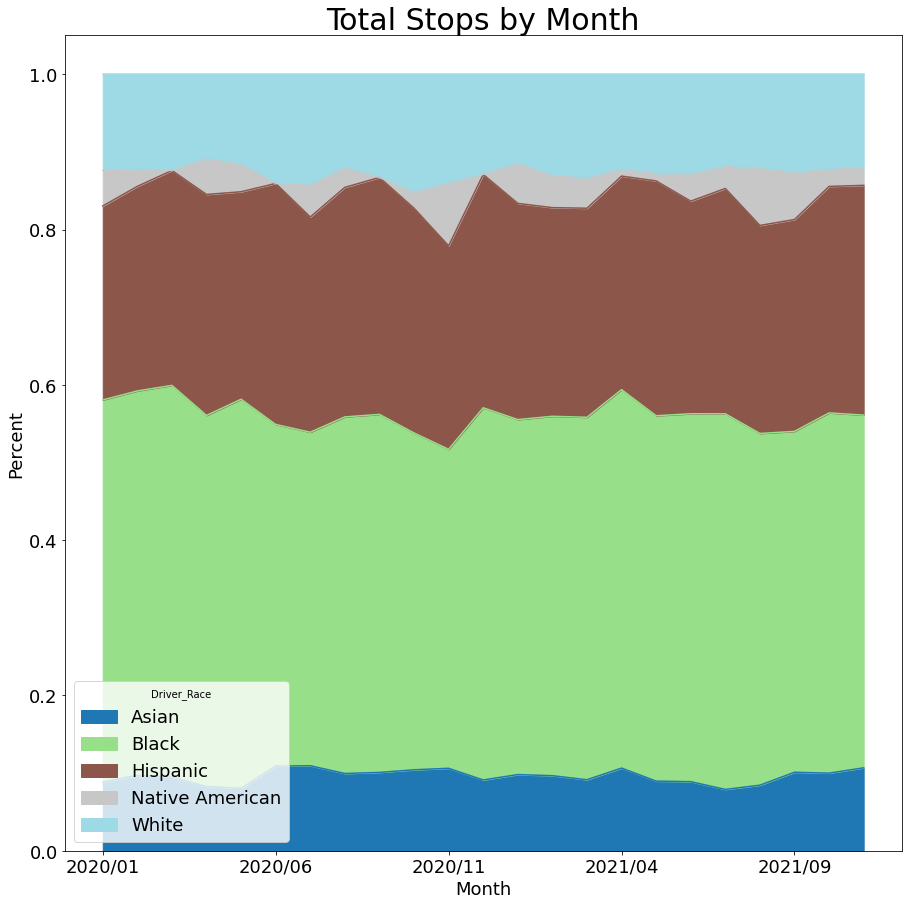

In [207]:
plt.rc('legend', fontsize=18)
totalStopsMonthly.plot.area(figsize=(15, 15), fontsize=18, colormap='tab20')
plt.plot()
plt.xlabel('Month', fontsize=18)
plt.ylabel('Percent', fontsize=18)
plt.title('Total Stops by Month', fontsize=30)
plt.savefig('/content/drive/My Drive/TrafficStopsWebGeneration/HTML/images/timechart_stopped.png')

In [208]:
temp=totalStopsRace[totalStopsRace['Was_a_Search_Conducted']=='Yes']
totalStopsMonthly=temp.groupby(['Month_of_Stop', 'Driver_Race'])['OBJECTID'].count()
print(totalStopsMonthly)
totalStopsMonthly=totalStopsMonthly.reset_index()
totalStopsMonthly=totalStopsMonthly.pivot(index='Month_of_Stop', columns='Driver_Race', values='OBJECTID')
totalStopsMonthly=totalStopsMonthly.div(totalStopsMonthly.sum(axis=1), axis=0);

Month_of_Stop  Driver_Race    
2020/01        Asian                4
               Black              406
               Hispanic            46
               Native American      2
               White               76
                                 ... 
2021/10        White               38
2021/11        Asian                2
               Black               79
               Hispanic             5
               White                8
Name: OBJECTID, Length: 88, dtype: int64


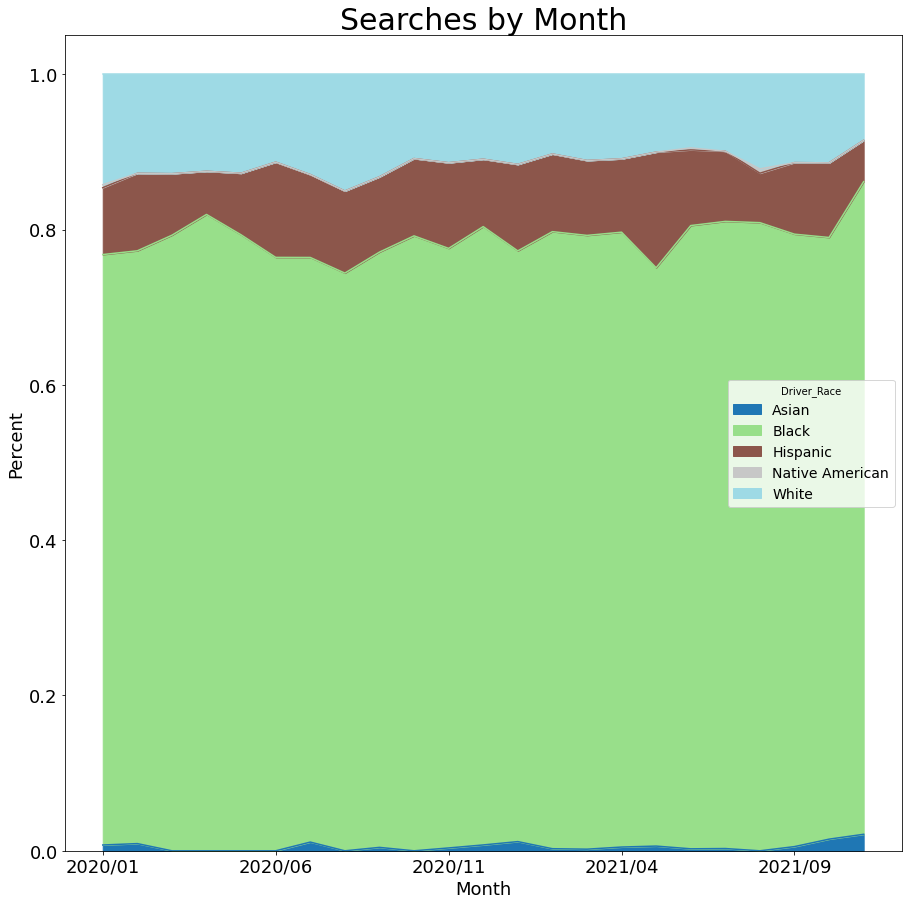

In [209]:
plt.rc('legend', fontsize=14)
totalStopsMonthly.plot.area(figsize=(15, 15), fontsize=18, colormap='tab20')
plt.plot()
plt.xlabel('Month', fontsize=18)
plt.ylabel('Percent', fontsize=18)
plt.title('Searches by Month', fontsize=30)
plt.savefig('/content/drive/My Drive/TrafficStopsWebGeneration/HTML/images/timechart_searched.png')

In [210]:
temp=totalStopsRace[totalStopsRace['Result_of_Stop']=='Arrest']
totalStopsMonthly=temp.groupby(['Month_of_Stop', 'Driver_Race'])['OBJECTID'].count()
print(totalStopsMonthly)
totalStopsMonthly=totalStopsMonthly.reset_index()
totalStopsMonthly=totalStopsMonthly.pivot(index='Month_of_Stop', columns='Driver_Race', values='OBJECTID')
totalStopsMonthly=totalStopsMonthly.div(totalStopsMonthly.sum(axis=1), axis=0);

Month_of_Stop  Driver_Race
2020/01        Asian            2
               Black          160
               Hispanic        19
               White           32
2020/02        Asian            2
                             ... 
2021/10        Hispanic        23
               White           22
2021/11        Black           28
               Hispanic         2
               White            6
Name: OBJECTID, Length: 85, dtype: int64


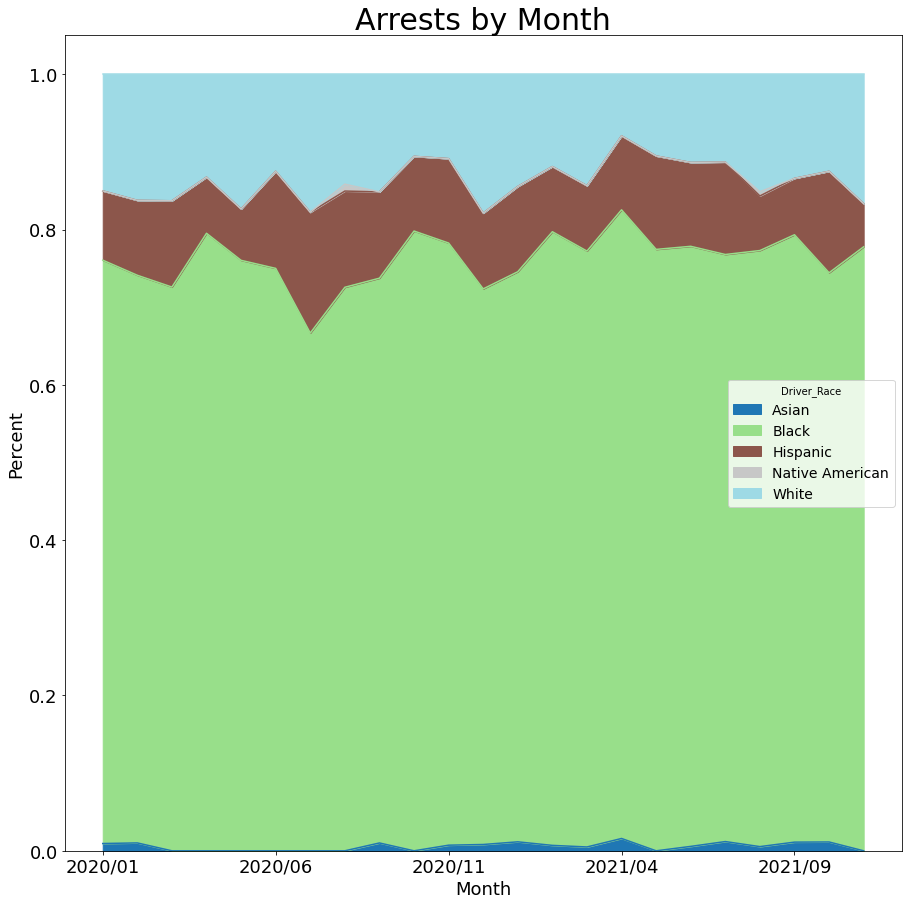

In [211]:
totalStopsMonthly.plot.area(figsize=(15, 15), fontsize=18, colormap='tab20')
plt.plot()
plt.xlabel('Month', fontsize=18)
plt.ylabel('Percent', fontsize=18)
plt.title('Arrests by Month', fontsize=30)
plt.savefig('/content/drive/My Drive/TrafficStopsWebGeneration/HTML/images/timechart_arrested.png')

In [212]:
totalStopsMonthly=totalStopsRace.groupby(['Month_of_Stop', 'Driver_Race'])['OBJECTID'].count()

totalStopsMonthly=totalStopsMonthly.reset_index()
totalStopsMonthly['OBJECTID']=np.where(totalStopsMonthly['Driver_Race']=='White', (totalStopsMonthly['OBJECTID'] / tempCensus['White'].iloc[0])*100, totalStopsMonthly['OBJECTID'])
totalStopsMonthly['OBJECTID']=np.where(totalStopsMonthly['Driver_Race']=='Black', (totalStopsMonthly['OBJECTID'] / tempCensus['African_American'].iloc[0])*100, totalStopsMonthly['OBJECTID'])
print(totalStopsMonthly)
totalStopsMonthly=totalStopsMonthly.pivot(index='Month_of_Stop', columns='Driver_Race', values='OBJECTID')
totalStopsMonthly=totalStopsMonthly.drop(columns={'Asian', 'Hispanic', 'Native American'})
totalStopsMonthly=totalStopsMonthly.div(totalStopsMonthly.sum(axis=1), axis=0);

    Month_of_Stop      Driver_Race     OBJECTID
0         2020/01            Asian   154.000000
1         2020/01            Black     2.024017
2         2020/01         Hispanic  1150.000000
3         2020/01  Native American     8.000000
4         2020/01            White     0.510074
..            ...              ...          ...
106       2021/11            Asian    47.000000
107       2021/11            Black     0.471705
108       2021/11         Hispanic   344.000000
109       2021/11  Native American     1.000000
110       2021/11            White     0.125161

[111 rows x 3 columns]


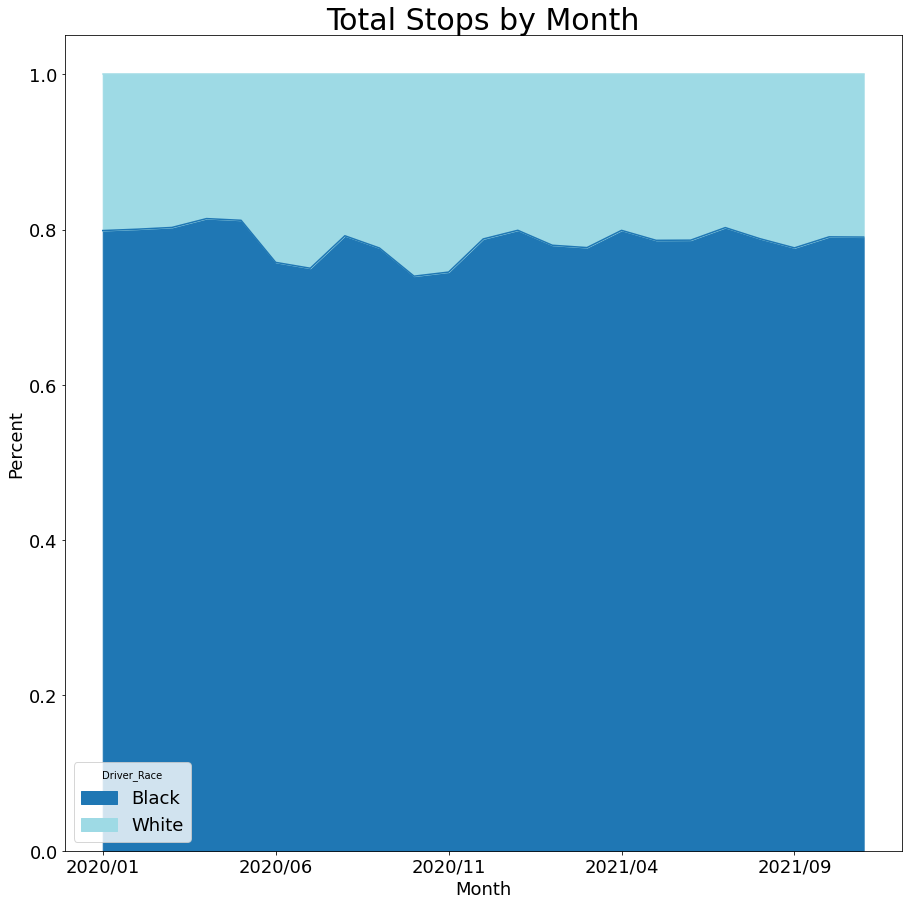

In [213]:
plt.rc('legend', fontsize=18)
totalStopsMonthly.plot.area(figsize=(15, 15), fontsize=18, colormap='tab20')
plt.plot()
plt.xlabel('Month', fontsize=18)
plt.ylabel('Percent', fontsize=18)
plt.title('Total Stops by Month', fontsize=30)
plt.savefig('/content/drive/My Drive/TrafficStopsWebGeneration/HTML/images/timechart_stopped_bw.png')

In [248]:
temp=totalStopsRace[totalStopsRace['Was_a_Search_Conducted']=='Yes']
totalStopsMonthly=temp.groupby(['Month_of_Stop', 'Driver_Race'])['OBJECTID'].count()
print(totalStopsMonthly)
totalStopsMonthly=totalStopsMonthly.reset_index()
totalStopsMonthly=totalStopsMonthly.pivot(index='Month_of_Stop', columns='Driver_Race', values='OBJECTID')
totalStopsMonthly=totalStopsMonthly.drop(columns={'Asian', 'Hispanic', 'Native American'})
totalStopsMonthly=totalStopsMonthly.div(totalStopsMonthly.sum(axis=1), axis=0);

Month_of_Stop  Driver_Race    
2020/01        Asian                4
               Black              406
               Hispanic            46
               Native American      2
               White               76
                                 ... 
2021/10        White               38
2021/11        Asian                2
               Black               79
               Hispanic             5
               White                8
Name: OBJECTID, Length: 88, dtype: int64


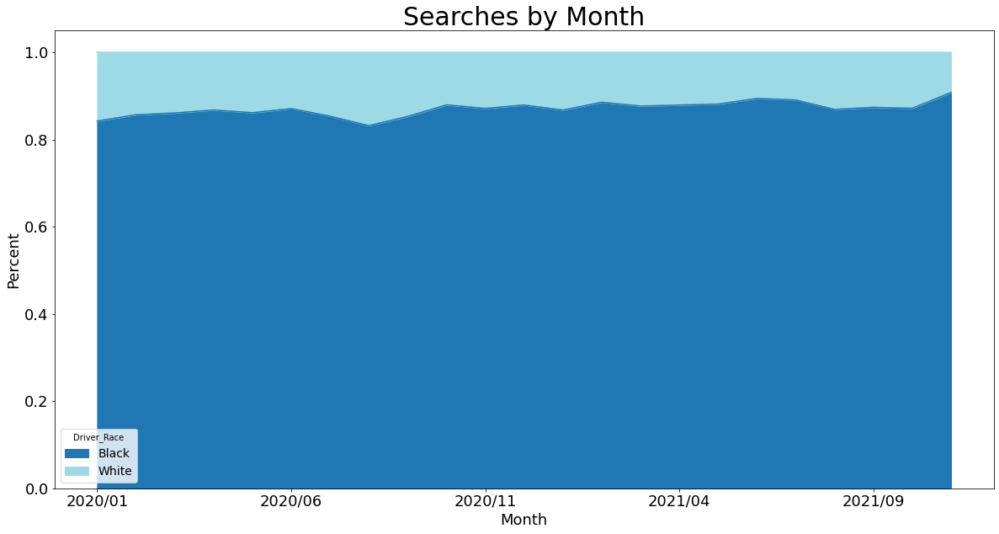

In [249]:
plt.rc('legend', fontsize=14)
totalStopsMonthly.plot.area(figsize=(20, 10), fontsize=18, colormap='tab20')
plt.plot()
plt.xlabel('Month', fontsize=18)
plt.ylabel('Percent', fontsize=18)
plt.title('Searches by Month', fontsize=30)
plt.savefig('/content/drive/My Drive/TrafficStopsWebGeneration/HTML/images/timechart_searched_bw.png')

In [216]:
temp=totalStopsRace[totalStopsRace['Result_of_Stop']=='Arrest']
totalStopsMonthly=temp.groupby(['Month_of_Stop', 'Driver_Race'])['OBJECTID'].count()
print(totalStopsMonthly)
totalStopsMonthly=totalStopsMonthly.reset_index()
totalStopsMonthly=totalStopsMonthly.pivot(index='Month_of_Stop', columns='Driver_Race', values='OBJECTID')
totalStopsMonthly=totalStopsMonthly.drop(columns={'Asian', 'Hispanic', 'Native American'})
totalStopsMonthly=totalStopsMonthly.div(totalStopsMonthly.sum(axis=1), axis=0);

Month_of_Stop  Driver_Race
2020/01        Asian            2
               Black          160
               Hispanic        19
               White           32
2020/02        Asian            2
                             ... 
2021/10        Hispanic        23
               White           22
2021/11        Black           28
               Hispanic         2
               White            6
Name: OBJECTID, Length: 85, dtype: int64


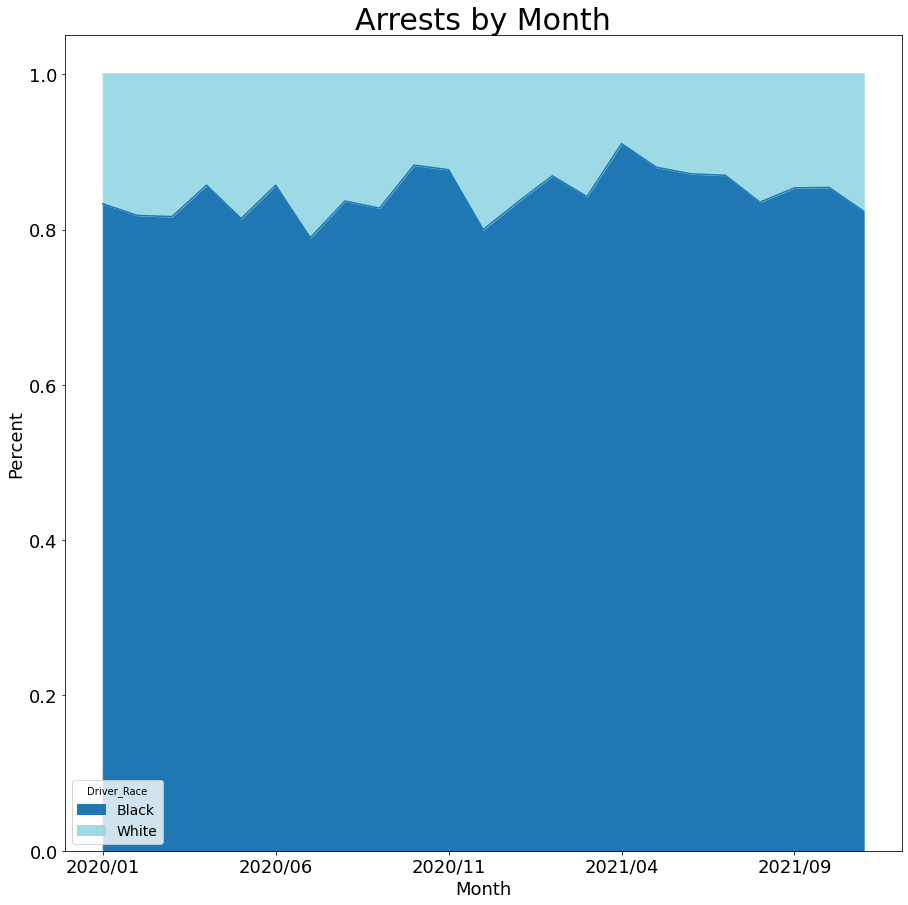

In [217]:
totalStopsMonthly.plot.area(figsize=(15, 15), fontsize=18, colormap='tab20')
plt.plot()
plt.xlabel('Month', fontsize=18)
plt.ylabel('Percent', fontsize=18)
plt.title('Arrests by Month', fontsize=30)
plt.savefig('/content/drive/My Drive/TrafficStopsWebGeneration/HTML/images/timechart_arrested_bw.png')

In [218]:
eth_grouping = dt
#eth_grouping=deth.groupby(['Driver_Race', 'Driver_Ethnicity', 'Was_a_Search_Conducted']).count()['Officer_Race']
eth_grouping['Driver_Race']= np.where(((eth_grouping['Driver_Ethnicity']=='Hispanic')),'Hispanic',eth_grouping['Driver_Race'])
eth_grouping=eth_grouping[eth_grouping['Driver_Race']!='Other/Unknown']
search=eth_grouping.groupby(['Driver_Race', 'Was_a_Search_Conducted']).count()['OBJECTID']
search=search.to_frame()
search=search.reset_index()

search=search.pivot(index='Driver_Race', columns='Was_a_Search_Conducted', values='OBJECTID')

search['Percent Searched']=search['Yes'] / (search['Yes'] + search['No'])
search=search.drop(columns={'No', 'Yes'})
search=search.sort_values(by='Percent Searched', ascending=False)
print(search)

Was_a_Search_Conducted  Percent Searched
Driver_Race                             
Black                           0.078689
Native American                 0.064935
Hispanic                        0.040580
White                           0.024037
Asian                           0.016282


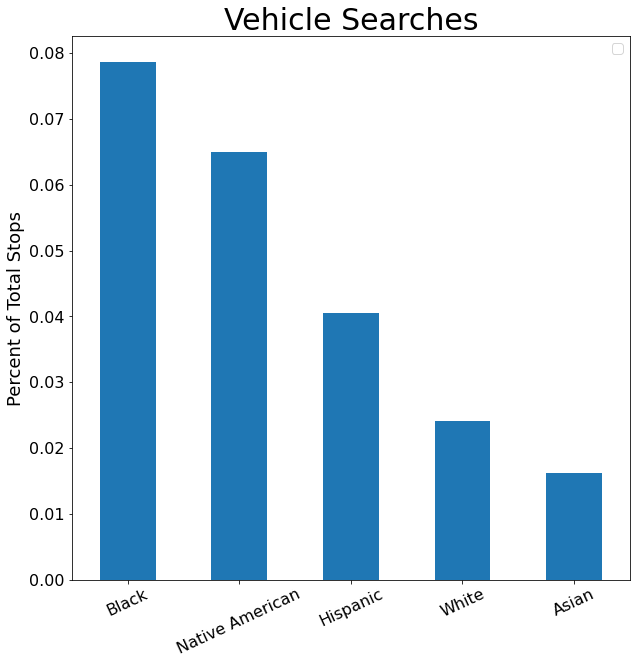

In [219]:
search.plot.bar(figsize=(10, 10), fontsize=16)
plt.xticks(rotation=25)
plt.plot()
plt.xlabel('', fontsize=18)
plt.ylabel('Percent of Total Stops', fontsize=18)
plt.title('Vehicle Searches', fontsize=30)
plt.legend('')
plt.savefig('/content/drive/My Drive/TrafficStopsWebGeneration/HTML/images/searched_adjusted.png')

In [220]:
eth_grouping = dt
#eth_grouping=deth.groupby(['Driver_Race', 'Driver_Ethnicity', 'Was_a_Search_Conducted']).count()['Officer_Race']
eth_grouping['Driver_Race']= np.where(((eth_grouping['Driver_Ethnicity']=='Hispanic')),'Hispanic',eth_grouping['Driver_Race'])
eth_grouping=eth_grouping[eth_grouping['Driver_Race']!='Other/Unknown']
search=eth_grouping.groupby(['Driver_Race', 'Was_a_Search_Conducted', 'Result_of_Stop']).count()['OBJECTID']

search=search.to_frame()
search=search.reset_index()
search=search[search['Was_a_Search_Conducted']=='Yes']
search=search.drop(columns={'Was_a_Search_Conducted'})
search=search.pivot(index='Driver_Race', columns='Result_of_Stop', values='OBJECTID')
search=search.fillna(0)
search['Free']=search['Citation Issued'] + search['No Action Taken'] + search['Verbal Warning'] + search['Written Warning']
search['Percent Arrest']=search['Arrest'] / (search['Arrest'] + search['Free'])
search=search.drop(columns={'Arrest', 'Citation Issued', 'No Action Taken', 'Verbal Warning', 'Written Warning', 'Free'})
#search['Percent Searched']=search['Yes'] / (search['Yes'] + search['No'])
#search=search.drop(columns={'No', 'Yes'})
#search=search.sort_values(by='Percent Searched', ascending=False)
search=search.sort_values(by='Percent Arrest', ascending=False)
search.head(2)

Result_of_Stop,Percent Arrest
Driver_Race,
Asian,0.388889
White,0.360329


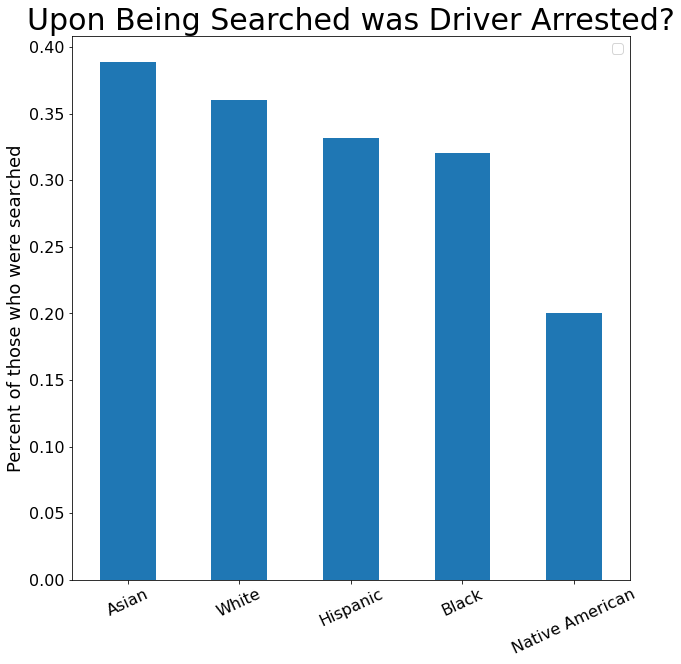

In [221]:
search.plot.bar(figsize=(10, 10), ylabel="", xlabel="", fontsize=16)
plt.xticks(rotation=25)
plt.plot()
plt.xlabel('', fontsize=18)
plt.ylabel('Percent of those who were searched', fontsize=18)
plt.title('Upon Being Searched was Driver Arrested?', fontsize=30)
plt.legend('')
plt.savefig('/content/drive/My Drive/TrafficStopsWebGeneration/HTML/images/searched_arrested_adjusted.png')

In [222]:
totalStopsMonthly=totalStopsRace.groupby(['Month_of_Stop', 'Driver_Gender'])['OBJECTID'].count()
print(totalStopsMonthly)
totalStopsMonthly=totalStopsMonthly.reset_index()
totalStopsMonthly=totalStopsMonthly.pivot(index='Month_of_Stop', columns='Driver_Gender', values='OBJECTID')

totalStopsMonthly=totalStopsMonthly.div(totalStopsMonthly.sum(axis=1), axis=0);

Month_of_Stop  Driver_Gender
2020/01        Female           3997
               Male             5635
2020/02        Female           3177
               Male             4735
2020/03        Female           2134
               Male             3429
2020/04        Female            749
               Male             1573
2020/05        Female           1700
               Male             2975
2020/06        Female            573
               Male             1107
2020/07        Female           1598
               Male             2369
2020/08        Female           1579
               Male             2705
2020/09        Female           1741
               Male             2849
2020/10        Female           2082
               Male             3445
2020/11        Female           2275
               Male             3541
2020/12        Female           1878
               Male             3189
2021/01        Female           2664
               Male             4481
2021/02  

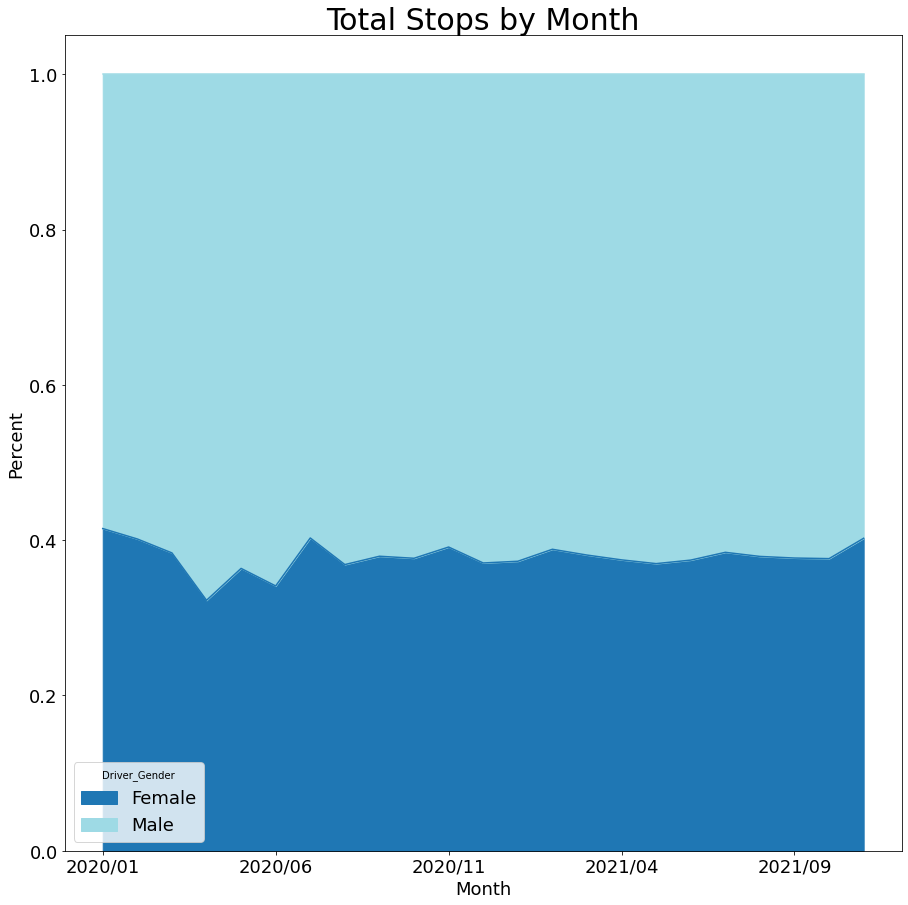

In [223]:
plt.rc('legend', fontsize=18)
totalStopsMonthly.plot.area(figsize=(15, 15), fontsize=18, colormap='tab20')
plt.plot()
plt.xlabel('Month', fontsize=18)
plt.ylabel('Percent', fontsize=18)
plt.title('Total Stops by Month', fontsize=30)
plt.savefig('/content/drive/My Drive/TrafficStopsWebGeneration/HTML/images/timechart_gender_stopped.png')

In [224]:
temp=totalStopsRace[totalStopsRace['Was_a_Search_Conducted']=='Yes']
totalStopsMonthly=temp.groupby(['Month_of_Stop', 'Driver_Gender'])['OBJECTID'].count()
print(totalStopsMonthly)
totalStopsMonthly=totalStopsMonthly.reset_index()
totalStopsMonthly=totalStopsMonthly.pivot(index='Month_of_Stop', columns='Driver_Gender', values='OBJECTID')

totalStopsMonthly=totalStopsMonthly.div(totalStopsMonthly.sum(axis=1), axis=0);

Month_of_Stop  Driver_Gender
2020/01        Female            82
               Male             452
2020/02        Female            78
               Male             353
2020/03        Female            44
               Male             284
2020/04        Female            35
               Male             181
2020/05        Female            63
               Male             290
2020/06        Female            11
               Male              95
2020/07        Female            36
               Male             142
2020/08        Female            38
               Male             208
2020/09        Female            36
               Male             191
2020/10        Female            36
               Male             185
2020/11        Female            39
               Male             233
2020/12        Female            37
               Male             228
2021/01        Female            71
               Male             351
2021/02        Female            53

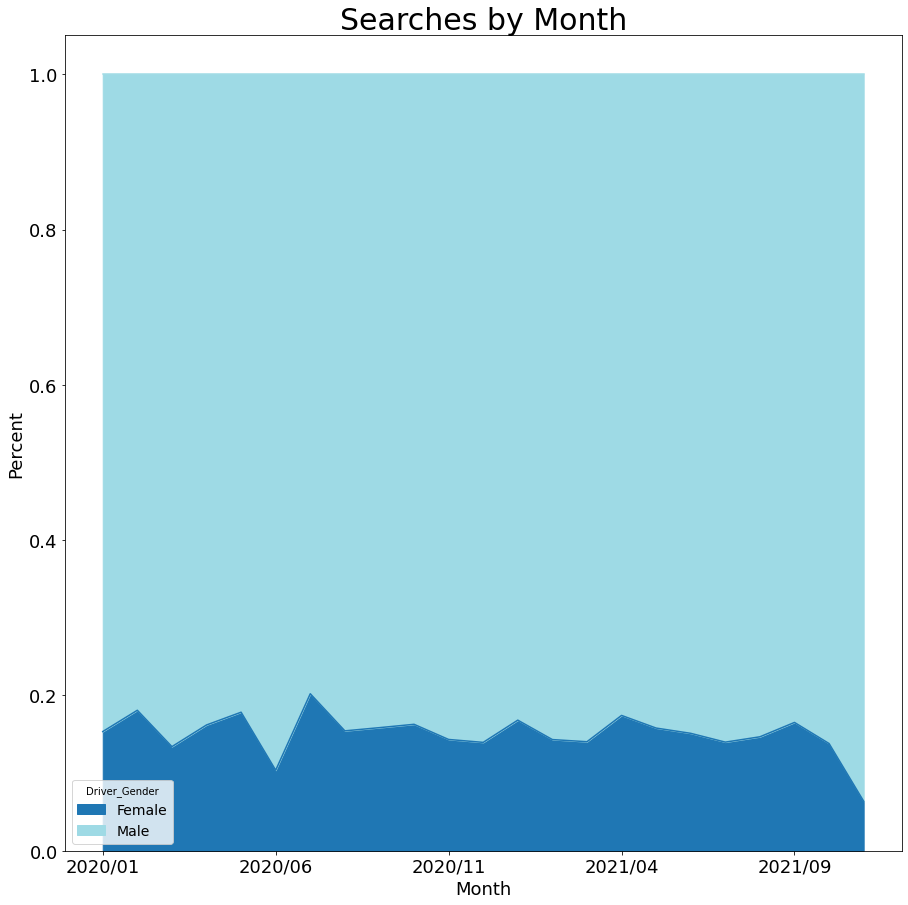

In [225]:
plt.rc('legend', fontsize=14)
totalStopsMonthly.plot.area(figsize=(15, 15), fontsize=18, colormap='tab20')
plt.plot()
plt.xlabel('Month', fontsize=18)
plt.ylabel('Percent', fontsize=18)
plt.title('Searches by Month', fontsize=30)
plt.savefig('/content/drive/My Drive/TrafficStopsWebGeneration/HTML/images/timechart_gender_searched.png')

In [226]:
temp=totalStopsRace[totalStopsRace['Result_of_Stop']=='Arrest']
totalStopsMonthly=temp.groupby(['Month_of_Stop', 'Driver_Gender'])['OBJECTID'].count()
print(totalStopsMonthly)
totalStopsMonthly=totalStopsMonthly.reset_index()
totalStopsMonthly=totalStopsMonthly.pivot(index='Month_of_Stop', columns='Driver_Gender', values='OBJECTID')

totalStopsMonthly=totalStopsMonthly.div(totalStopsMonthly.sum(axis=1), axis=0);

Month_of_Stop  Driver_Gender
2020/01        Female            28
               Male             185
2020/02        Female            45
               Male             152
2020/03        Female            23
               Male             112
2020/04        Female            18
               Male              65
2020/05        Female            23
               Male              98
2020/06        Female            10
               Male              46
2020/07        Female            18
               Male              72
2020/08        Female            18
               Male              95
2020/09        Female            13
               Male              86
2020/10        Female            25
               Male              79
2020/11        Female            27
               Male             111
2020/12        Female            19
               Male             104
2021/01        Female            39
               Male             134
2021/02        Female            18

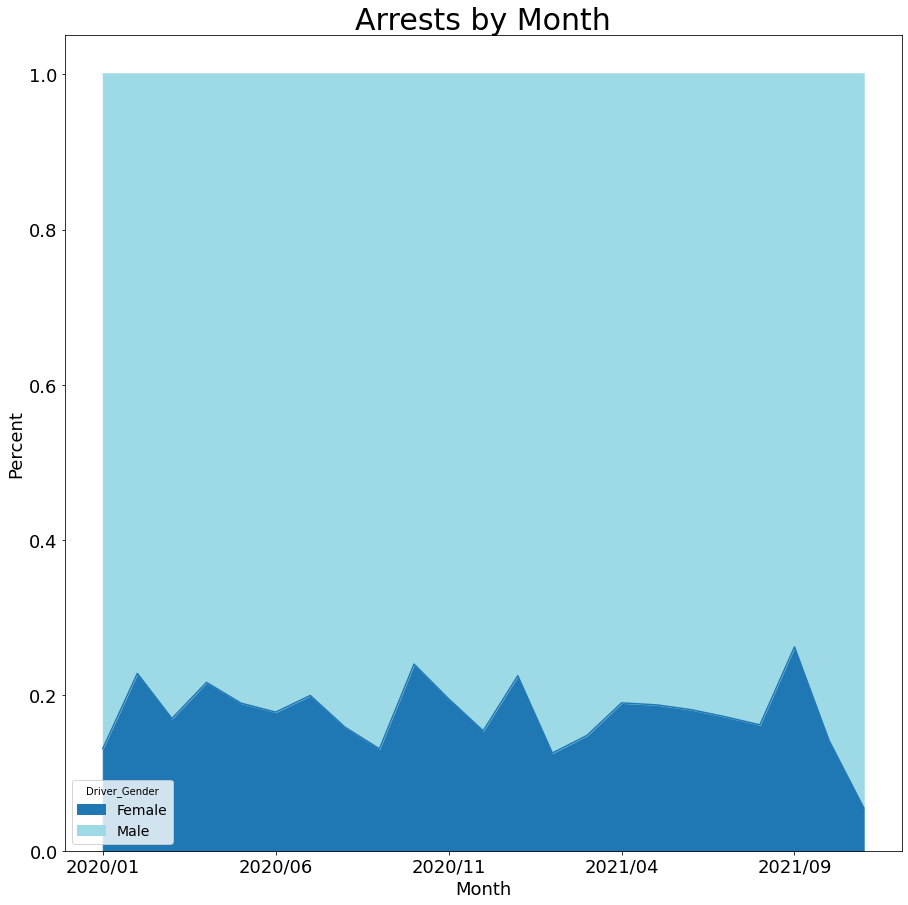

In [227]:
totalStopsMonthly.plot.area(figsize=(15, 15), fontsize=18, colormap='tab20')
plt.plot()
plt.xlabel('Month', fontsize=18)
plt.ylabel('Percent', fontsize=18)
plt.title('Arrests by Month', fontsize=30)
plt.savefig('/content/drive/My Drive/TrafficStopsWebGeneration/HTML/images/timechart_gender_arrested.png')

In [228]:
totalStopsMonthlyIntersect=totalStopsRace.groupby(['Month_of_Stop', 'Driver_Race', 'Driver_Gender'])['OBJECTID'].count()
print(tempCensus['White'])
totalStopsMonthlyIntersect=totalStopsMonthlyIntersect.reset_index()
totalStopsMonthlyIntersect['OBJECTID']=np.where(totalStopsMonthlyIntersect['Driver_Race']=='White', (totalStopsMonthlyIntersect['OBJECTID'] / tempCensus['White'].iloc[0])*100, totalStopsMonthlyIntersect['OBJECTID'])
totalStopsMonthlyIntersect['OBJECTID']=np.where(totalStopsMonthlyIntersect['Driver_Race']=='Native American', (totalStopsMonthlyIntersect['OBJECTID'] / tempCensus['AmerIn_AlaskaNative'].iloc[0])*100, totalStopsMonthlyIntersect['OBJECTID'])
totalStopsMonthlyIntersect['OBJECTID']=np.where(totalStopsMonthlyIntersect['Driver_Race']=='Hispanic', (totalStopsMonthlyIntersect['OBJECTID'] / tempCensus['Hispanic'].iloc[0])*100, totalStopsMonthlyIntersect['OBJECTID'])
totalStopsMonthlyIntersect['OBJECTID']=np.where(totalStopsMonthlyIntersect['Driver_Race']=='Black', (totalStopsMonthlyIntersect['OBJECTID'] / tempCensus['African_American'].iloc[0])*100, totalStopsMonthlyIntersect['OBJECTID'])
totalStopsMonthlyIntersect['OBJECTID']=np.where(totalStopsMonthlyIntersect['Driver_Race']=='Asian', (totalStopsMonthlyIntersect['OBJECTID'] / tempCensus['Asian'].iloc[0])*100, totalStopsMonthlyIntersect['OBJECTID'])
totalStopsMonthlyIntersect['demo']=totalStopsMonthlyIntersect['Driver_Race'] + " " + totalStopsMonthlyIntersect['Driver_Gender']
totalStopsMonthlyIntersect=totalStopsMonthlyIntersect.drop(columns={'Driver_Gender', 'Driver_Race'})
print(totalStopsMonthlyIntersect)
totalStopsMonthlyIntersect=totalStopsMonthlyIntersect.pivot(index='Month_of_Stop', columns='demo', values='OBJECTID')
totalStopsMonthlyIntersect=totalStopsMonthlyIntersect.div(totalStopsMonthlyIntersect.sum(axis=1), axis=0);

0    508946
Name: White, dtype: int64
    Month_of_Stop  OBJECTID                  demo
0         2020/01  0.139309          Asian Female
1         2020/01  0.224311            Asian Male
2         2020/01  0.860667          Black Female
3         2020/01  1.163350            Black Male
4         2020/01  0.327842       Hispanic Female
..            ...       ...                   ...
211       2021/11  0.092010       Hispanic Female
212       2021/11  0.215286         Hispanic Male
213       2021/11  0.023469  Native American Male
214       2021/11  0.053444          White Female
215       2021/11  0.071717            White Male

[216 rows x 3 columns]


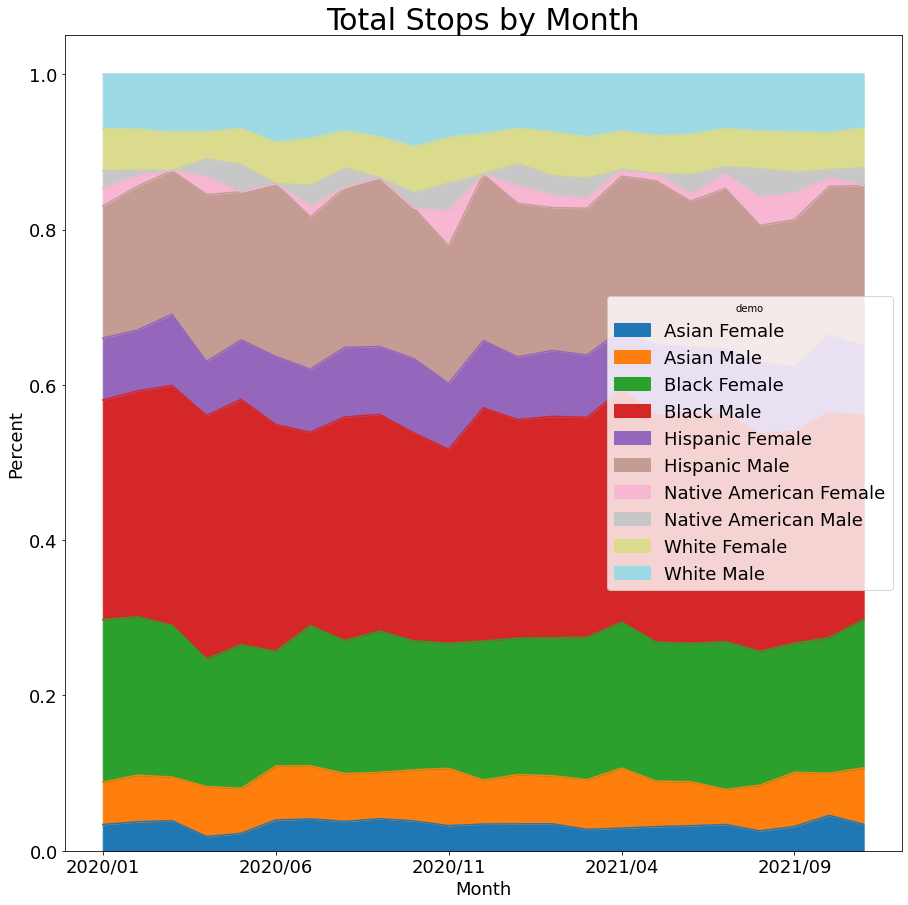

In [229]:
plt.rc('legend', fontsize=18)
totalStopsMonthlyIntersect.plot.area(figsize=(15, 15), fontsize=18, colormap='tab20')
plt.plot()
plt.xlabel('Month', fontsize=18)
plt.ylabel('Percent', fontsize=18)
plt.title('Total Stops by Month', fontsize=30)
plt.savefig('/content/drive/My Drive/TrafficStopsWebGeneration/HTML/images/timechart_intersect_stopped.png')

In [230]:
totalStopsIntersect=totalStopsRace.groupby(['Driver_Race', 'Driver_Gender'])['OBJECTID'].count()
totalStopsIntersect=totalStopsIntersect.reset_index()
totalStopsIntersect['OBJECTID']=np.where(totalStopsIntersect['Driver_Race']=='White', (totalStopsIntersect['OBJECTID'] / tempCensus['White'].iloc[0]), totalStopsIntersect['OBJECTID'])
totalStopsIntersect['OBJECTID']=np.where(totalStopsIntersect['Driver_Race']=='Native American', (totalStopsIntersect['OBJECTID'] / tempCensus['AmerIn_AlaskaNative'].iloc[0]), totalStopsIntersect['OBJECTID'])
totalStopsIntersect['OBJECTID']=np.where(totalStopsIntersect['Driver_Race']=='Hispanic', (totalStopsIntersect['OBJECTID'] / tempCensus['Hispanic'].iloc[0]), totalStopsIntersect['OBJECTID'])
totalStopsIntersect['OBJECTID']=np.where(totalStopsIntersect['Driver_Race']=='Black', (totalStopsIntersect['OBJECTID'] / tempCensus['African_American'].iloc[0]), totalStopsIntersect['OBJECTID'])
totalStopsIntersect['OBJECTID']=np.where(totalStopsIntersect['Driver_Race']=='Asian', (totalStopsIntersect['OBJECTID'] / tempCensus['Asian'].iloc[0]), totalStopsIntersect['OBJECTID'])
totalStopsIntersect['demo']=totalStopsIntersect['Driver_Race'] + " " + totalStopsIntersect['Driver_Gender']
totalStopsIntersect=totalStopsIntersect.drop(columns={'Driver_Gender', 'Driver_Race'})
print(totalStopsIntersect)
totalStopsIntersect=totalStopsIntersect.set_index('demo')
totalStopsIntersect=totalStopsIntersect.sort_values(by='OBJECTID', ascending=False)

   OBJECTID                    demo
0  0.018441            Asian Female
1  0.033765              Asian Male
2  0.099436            Black Female
3  0.156433              Black Male
4  0.046425         Hispanic Female
5  0.105687           Hispanic Male
6  0.007979  Native American Female
7  0.010092    Native American Male
8  0.028254            White Female
9  0.041391              White Male


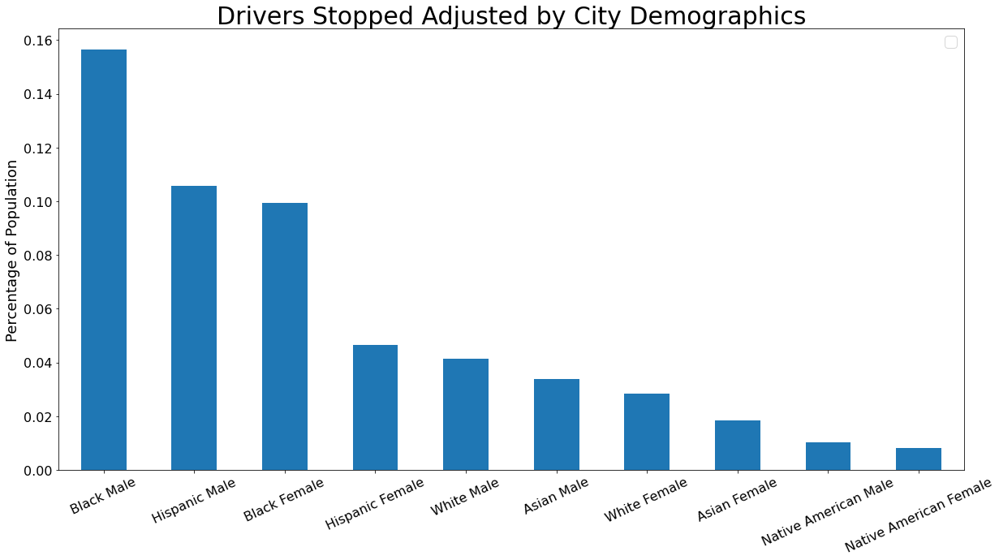

In [231]:
totalStopsIntersect.plot.bar(figsize=(20, 10), ylabel="", xlabel="", fontsize=16)
plt.xticks(rotation=25)
plt.plot()
plt.legend('')
plt.xlabel('', fontsize=18)
plt.ylabel('Percentage of Population', fontsize=18)
plt.title('Drivers Stopped Adjusted by City Demographics', fontsize=30)
plt.savefig('/content/drive/My Drive/TrafficStopsWebGeneration/HTML/images/drivers_stopped_intersect_adjusted.png')

In [232]:
searched=totalStopsRace[totalStopsRace['Was_a_Search_Conducted']=='Yes']
totalStopsIntersect=searched.groupby(['Driver_Race', 'Driver_Gender'])['OBJECTID'].count()
totalStopsIntersect=totalStopsIntersect.reset_index()
#totalStopsIntersect['OBJECTID']=np.where(totalStopsIntersect['Driver_Race']=='White', (totalStopsIntersect['OBJECTID'] / tempCensus['White'].iloc[0]), totalStopsIntersect['OBJECTID'])
#totalStopsIntersect['OBJECTID']=np.where(totalStopsIntersect['Driver_Race']=='Native American', (totalStopsIntersect['OBJECTID'] / tempCensus['AmerIn_AlaskaNative'].iloc[0]), totalStopsIntersect['OBJECTID'])
#totalStopsIntersect['OBJECTID']=np.where(totalStopsIntersect['Driver_Race']=='Hispanic', (totalStopsIntersect['OBJECTID'] / tempCensus['Hispanic'].iloc[0]), totalStopsIntersect['OBJECTID'])
#totalStopsIntersect['OBJECTID']=np.where(totalStopsIntersect['Driver_Race']=='Black', (totalStopsIntersect['OBJECTID'] / tempCensus['African_American'].iloc[0]), totalStopsIntersect['OBJECTID'])
#totalStopsIntersect['OBJECTID']=np.where(totalStopsIntersect['Driver_Race']=='Asian', (totalStopsIntersect['OBJECTID'] / tempCensus['Asian'].iloc[0]), totalStopsIntersect['OBJECTID'])
totalStopsIntersect['demo']=totalStopsIntersect['Driver_Race'] + " " + totalStopsIntersect['Driver_Gender']
totalStopsIntersect=totalStopsIntersect.drop(columns={'Driver_Gender', 'Driver_Race'})
print(totalStopsIntersect)
totalStopsIntersect=totalStopsIntersect.set_index('demo')
totalStopsIntersect=totalStopsIntersect.sort_values(by='OBJECTID', ascending=False)

   OBJECTID                    demo
0         3            Asian Female
1        33              Asian Male
2       808            Black Female
3      4886              Black Male
4        77         Hispanic Female
5       614           Hispanic Male
6         1  Native American Female
7         4    Native American Male
8       234            White Female
9       618              White Male


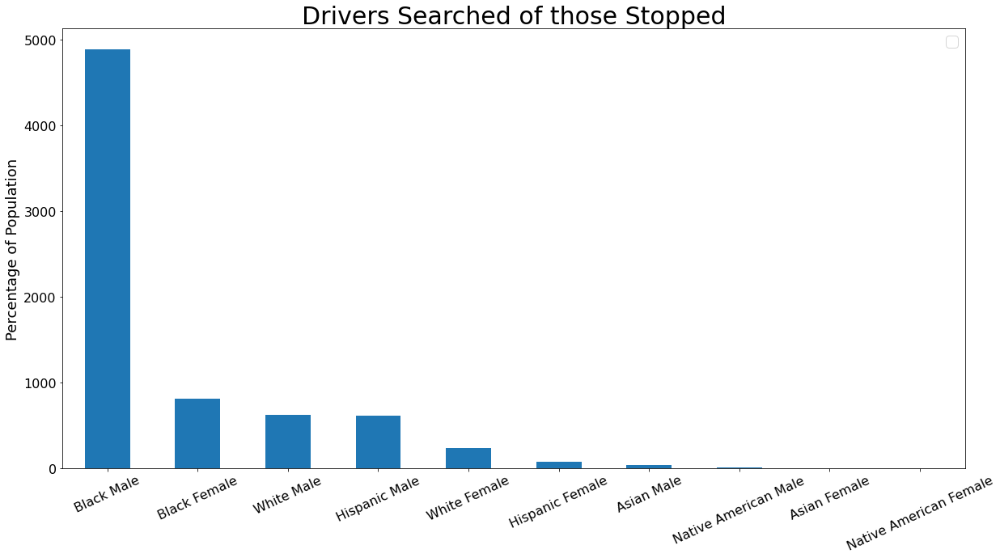

In [233]:
totalStopsIntersect.plot.bar(figsize=(20, 10), ylabel="", xlabel="", fontsize=16)
plt.xticks(rotation=25)
plt.plot()
plt.legend('')
plt.xlabel('', fontsize=18)
plt.ylabel('Percentage of Population', fontsize=18)
plt.title('Drivers Searched of those Stopped', fontsize=30)
plt.savefig('/content/drive/My Drive/TrafficStopsWebGeneration/HTML/images/drivers_searched_intersect_adjusted.png')

In [234]:
eth_grouping = dt
#eth_grouping=deth.groupby(['Driver_Race', 'Driver_Ethnicity', 'Was_a_Search_Conducted']).count()['Officer_Race']
eth_grouping['Driver_Race']= np.where(((eth_grouping['Driver_Ethnicity']=='Hispanic')),'Hispanic',eth_grouping['Driver_Race'])
eth_grouping=eth_grouping[eth_grouping['Driver_Race']!='Other/Unknown']
search=eth_grouping.groupby(['Driver_Race', 'Driver_Gender', 'Was_a_Search_Conducted']).count()['OBJECTID']

search=search.to_frame()
search=search.reset_index()
search['demo']=search['Driver_Race'] + " " + search['Driver_Gender']

search=search.pivot(index='demo', columns='Was_a_Search_Conducted', values='OBJECTID')

search['Percent Searched']=search['Yes'] / (search['Yes'] + search['No'])
search=search.drop(columns={'No', 'Yes'})
search=search.sort_values(by='Percent Searched', ascending=False)
print(search)

Was_a_Search_Conducted  Percent Searched
demo                                    
Black Male                      0.110443
Native American Male            0.093023
Hispanic Male                   0.051898
Native American Female          0.029412
White Male                      0.029336
Black Female                    0.028733
Asian Male                      0.023077
White Female                    0.016273
Hispanic Female                 0.014816
Asian Female                    0.003841


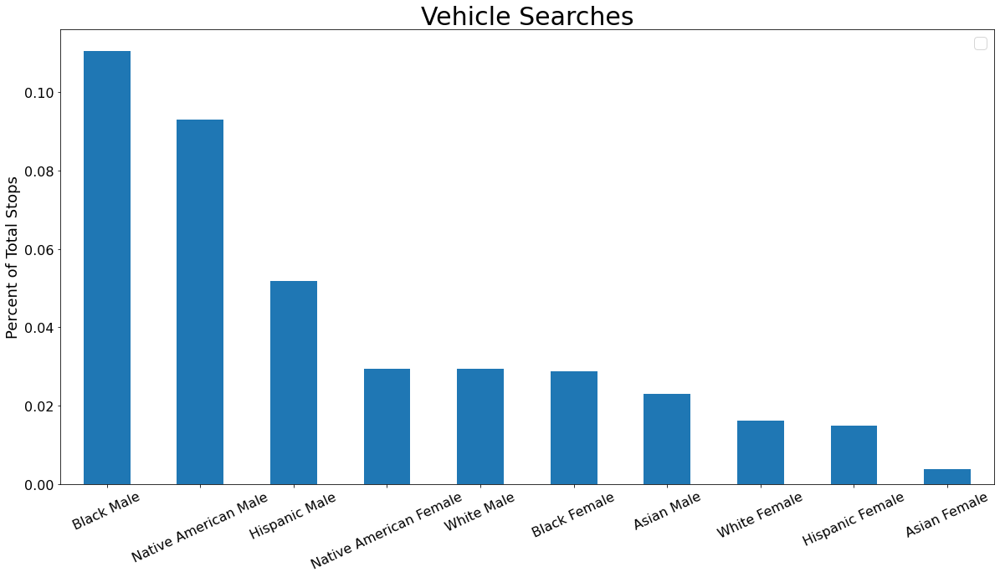

In [235]:
search.plot.bar(figsize=(20, 10), fontsize=16)
plt.xticks(rotation=25)
plt.plot()
plt.xlabel('', fontsize=18)
plt.ylabel('Percent of Total Stops', fontsize=18)
plt.title('Vehicle Searches', fontsize=30)
plt.legend('')
plt.savefig('/content/drive/My Drive/TrafficStopsWebGeneration/HTML/images/searched_intersect_adjusted.png')

In [236]:
eth_grouping = dt
#eth_grouping=deth.groupby(['Driver_Race', 'Driver_Ethnicity', 'Was_a_Search_Conducted']).count()['Officer_Race']
eth_grouping['Driver_Race']= np.where(((eth_grouping['Driver_Ethnicity']=='Hispanic')),'Hispanic',eth_grouping['Driver_Race'])
eth_grouping=eth_grouping[eth_grouping['Driver_Race']!='Other/Unknown']
search=eth_grouping.groupby(['Driver_Race', 'Driver_Gender', 'Was_a_Search_Conducted', 'Result_of_Stop']).count()['OBJECTID']

search=search.to_frame()
search=search.reset_index()
search=search[search['Was_a_Search_Conducted']=='Yes']
search=search.drop(columns={'Was_a_Search_Conducted'})
print(search)
search['demo']=search['Driver_Race'] + " " + search['Driver_Gender']

search=search.pivot(index='demo', columns='Result_of_Stop', values='OBJECTID')
search=search.fillna(0)
search['Free']=search['Citation Issued'] + search['No Action Taken'] + search['Verbal Warning'] + search['Written Warning']
search['Percent Arrest']=search['Arrest'] / (search['Arrest'] + search['Free'])
search=search.drop(columns={'Arrest', 'Citation Issued', 'No Action Taken', 'Verbal Warning', 'Written Warning', 'Free'})
#search['Percent Searched']=search['Yes'] / (search['Yes'] + search['No'])
#search=search.drop(columns={'No', 'Yes'})
#search=search.sort_values(by='Percent Searched', ascending=False)
search=search.sort_values(by='Percent Arrest', ascending=False)
search.head(2)

        Driver_Race Driver_Gender   Result_of_Stop  OBJECTID
5             Asian        Female           Arrest         1
6             Asian        Female  Citation Issued         1
7             Asian        Female   Verbal Warning         1
13            Asian          Male           Arrest        13
14            Asian          Male  Citation Issued         7
15            Asian          Male   Verbal Warning        13
21            Black        Female           Arrest       227
22            Black        Female  Citation Issued       167
23            Black        Female  No Action Taken        17
24            Black        Female   Verbal Warning       393
25            Black        Female  Written Warning         4
31            Black          Male           Arrest      1596
32            Black          Male  Citation Issued       713
33            Black          Male  No Action Taken        65
34            Black          Male   Verbal Warning      2454
35            Black     

Result_of_Stop,Percent Arrest
demo,
Native American Female,1.000000
White Female,0.418803


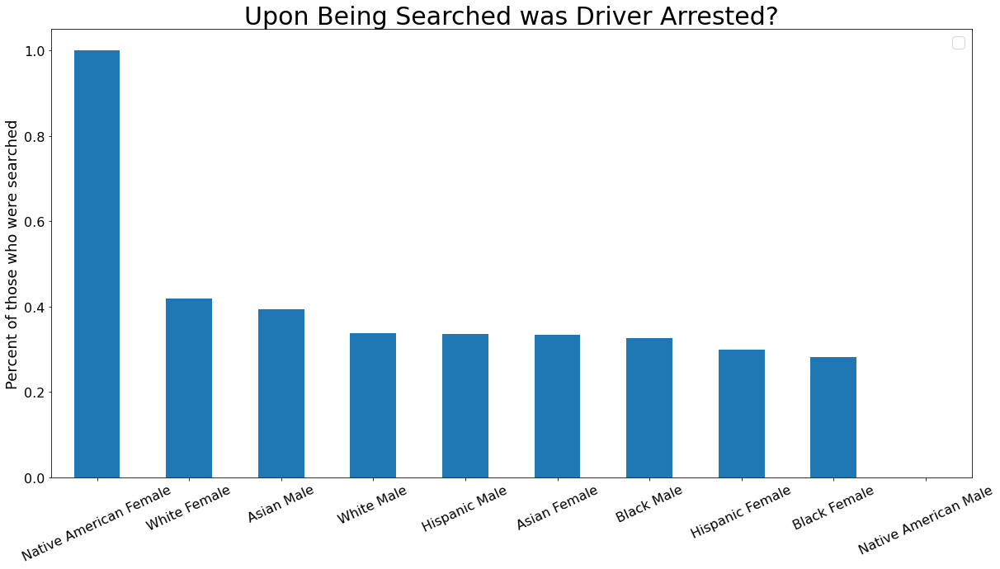

In [237]:
search.plot.bar(figsize=(20, 10), ylabel="", xlabel="", fontsize=16)
plt.xticks(rotation=25)
plt.plot()
plt.xlabel('', fontsize=18)
plt.ylabel('Percent of those who were searched', fontsize=18)
plt.title('Upon Being Searched was Driver Arrested?', fontsize=30)
plt.legend('')
plt.savefig('/content/drive/My Drive/TrafficStopsWebGeneration/HTML/images/searched_arrested_intersect_adjusted.png')

In [238]:
eth_grouping = dt
#eth_grouping = eth_grouping[eth_grouping['CMPD_Division']!='Metro Division']
eth_grouping['Driver_Race']= np.where(((eth_grouping['Driver_Ethnicity']=='Hispanic')),'Hispanic',eth_grouping['Driver_Race'])
eth_grouping=eth_grouping[eth_grouping['Driver_Race']!='Other/Unknown']
eth_grouping=eth_grouping[eth_grouping['Driver_Race']!='Asian']
eth_grouping=eth_grouping[eth_grouping['Driver_Race']!='Native American']
eth_grouping=eth_grouping[eth_grouping['Driver_Race']!='Hispanic']
search=eth_grouping.groupby(['Driver_Race', 'Was_a_Search_Conducted']).count()['OBJECTID']
search=search.to_frame()
search=search.reset_index()

search=search.pivot(index='Driver_Race', columns='Was_a_Search_Conducted', values='OBJECTID')

search['Percent Searched']=search['Yes'] / (search['Yes'] + search['No'])
search=search.drop(columns={'No', 'Yes'})
search=search.sort_values(by='Percent Searched', ascending=False)
search_all=search
print(search)

Was_a_Search_Conducted  Percent Searched
Driver_Race                             
Black                           0.078689
White                           0.024037


In [239]:
eth_grouping = dt
eth_grouping = eth_grouping[eth_grouping['CMPD_Division']!='Metro Division']
eth_grouping['Driver_Race']= np.where(((eth_grouping['Driver_Ethnicity']=='Hispanic')),'Hispanic',eth_grouping['Driver_Race'])
eth_grouping=eth_grouping[eth_grouping['Driver_Race']!='Other/Unknown']
eth_grouping=eth_grouping[eth_grouping['Driver_Race']!='Asian']
eth_grouping=eth_grouping[eth_grouping['Driver_Race']!='Native American']
eth_grouping=eth_grouping[eth_grouping['Driver_Race']!='Hispanic']
search=eth_grouping.groupby(['Driver_Race', 'Was_a_Search_Conducted']).count()['OBJECTID']
search=search.to_frame()
search=search.reset_index()

search=search.pivot(index='Driver_Race', columns='Was_a_Search_Conducted', values='OBJECTID')

search['Percent Searched']=search['Yes'] / (search['Yes'] + search['No'])
search=search.drop(columns={'No', 'Yes'})
search=search.sort_values(by='Percent Searched', ascending=False)
search_no_metro=search
print(search)

Was_a_Search_Conducted  Percent Searched
Driver_Race                             
Black                           0.063177
White                           0.021912


In [240]:
search=pd.merge(search_all, search_no_metro, how="left", on="Driver_Race")
search=search.rename(columns={'Percent Searched_x': 'All Divisons', 'Percent Searched_y': 'All but Metro Divison'})

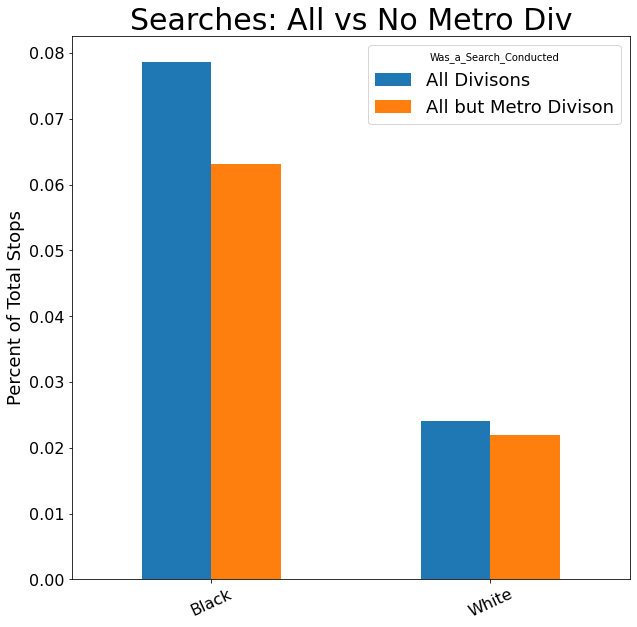

In [241]:
search.plot.bar(figsize=(10, 10), fontsize=16)
plt.xticks(rotation=25)
plt.plot()
plt.xlabel('', fontsize=18)
plt.ylabel('Percent of Total Stops', fontsize=18)
plt.title('Searches: All vs No Metro Div', fontsize=30)
#plt.legend('')
plt.savefig('/content/drive/My Drive/TrafficStopsWebGeneration/HTML/images/no_metro.png')

In [245]:
eth_grouping = dt
#eth_grouping=deth.groupby(['Driver_Race', 'Driver_Ethnicity', 'Was_a_Search_Conducted']).count()['Officer_Race']
eth_grouping['Driver_Race']= np.where(((eth_grouping['Driver_Ethnicity']=='Hispanic')),'Hispanic',eth_grouping['Driver_Race'])
eth_grouping=eth_grouping[eth_grouping['Driver_Race']!='Other/Unknown']
search=eth_grouping.groupby(['Driver_Gender', 'Was_a_Search_Conducted']).count()['OBJECTID']

search=search.to_frame()
search=search.reset_index()
#search['demo']=search['Driver_Race'] + " " + search['Driver_Gender']

search=search.pivot(index='Driver_Gender', columns='Was_a_Search_Conducted', values='OBJECTID')

search['Percent Searched']=search['Yes'] / (search['Yes'] + search['No'])
search=search.drop(columns={'No', 'Yes'})
search=search.sort_values(by='Percent Searched', ascending=False)
print(search)

Was_a_Search_Conducted  Percent Searched
Driver_Gender                           
Male                            0.078298
Female                          0.023148


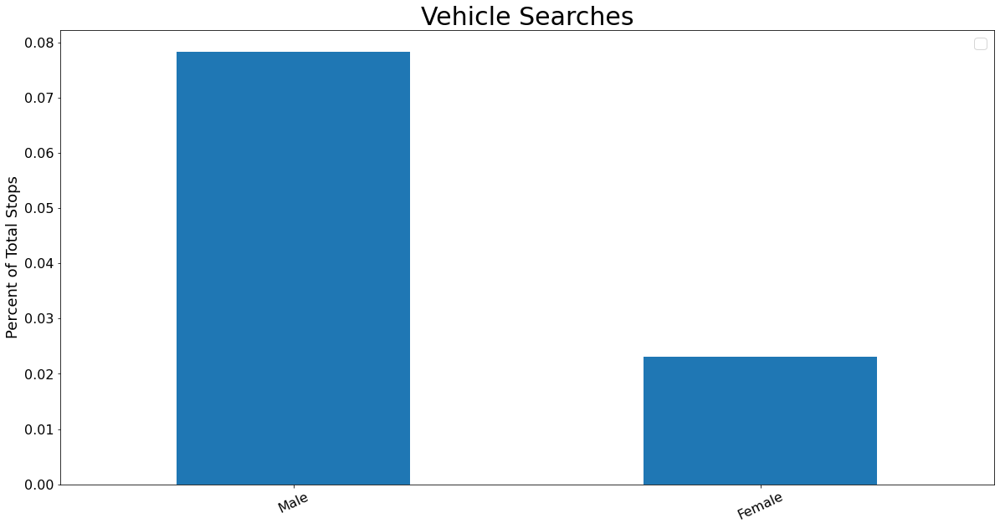

In [247]:
search.plot.bar(figsize=(20, 10), fontsize=16)
plt.xticks(rotation=25)
plt.plot()
plt.xlabel('', fontsize=18)
plt.ylabel('Percent of Total Stops', fontsize=18)
plt.title('Vehicle Searches', fontsize=30)
plt.legend('')
plt.savefig('/content/drive/My Drive/TrafficStopsWebGeneration/HTML/images/searched_genders_adjusted.png')